In [16]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import math

# =========================================================
# GLOBAL CONFIGURATION (rcParams)
# =========================================================

# 1. FONT AND TEXT SETTINGS
# ---
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'Helvetica', 'Lato', 'DejaVu Sans'],  # Priority list of clean fonts
    'font.size': 11,                                                   # Base font size for all elements

    # Specific settings for titles and axes
    'axes.titlesize': 15,                                              # Larger plot title size
    'axes.titleweight': 'bold',                                        # Bold title for emphasis
    'axes.labelsize': 13,                                              # Axis labels size (larger than base)
    'legend.fontsize': 11,                                             # Legend text size
})


# 2. AXES, TICKS, AND GRID SETTINGS
# ---
plt.rcParams.update({
    # GRID: Light and non-intrusive
    'axes.grid': True,              # Enable grid by default
    'grid.linestyle': '--',         # Dashed grid lines
    'grid.color': 'lightgray',      # Light color for grid
    'grid.alpha': 0.7,              # Transparency for grid

    # AXES SPINES (The box outline)
    'axes.spines.right': True,      # Draw right spine
    'axes.spines.top': True,        # Draw top spine
    'axes.edgecolor': 'black',      # Black color for the box outline
    'axes.linewidth': 1.2,          # Thickness of the box outline

    # MAJOR TICKS (The main markings with numbers)
    'xtick.direction': 'in',        # Major ticks pointing inwards
    'ytick.direction': 'in',
    'xtick.major.size': 6,          # Major tick length
    'ytick.major.size': 6,
    'xtick.top': True,              # Draw major ticks on the top side
    'ytick.right': True,            # Draw major ticks on the right side
    'xtick.labeltop': True,         # Show numbers on the upper X axis
    'ytick.labelright': True,       # Show numbers on the right Y axis
    
    # MINOR TICKS (Small markings between major ticks)
    'xtick.minor.visible': True,    # Enable minor ticks
    'ytick.minor.visible': True,
    'xtick.minor.top': True,        # Draw minor ticks on the top side
    'ytick.minor.right': True,
    'xtick.minor.size': 4,          # Minor tick length
    'xtick.minor.width': 0.8,       # Minor tick thickness
    'ytick.minor.width': 0.8,
})


# 3. LINES AND MARKERS SETTINGS
# ---
plt.rcParams.update({
    'lines.linewidth': 2.0,         # Default thickness for primary plot lines
    'lines.markersize': 4,          # Default size for data markers
    'lines.markeredgewidth': 1.0,   # Controls marker border thickness AND errorbar caps
})


# 4. ERRORBAR SETTINGS
# ---
plt.rcParams.update({
    'errorbar.capsize': 0.0,        # Length of the horizontal "caps" at the ends
})


# 5. LEGEND AND SAVING SETTINGS
# ---
plt.rcParams.update({
    # High-quality export settings (Best for a thesis)
    'figure.dpi': 300,              # Default display resolution (high quality)
    'savefig.format': 'png',        # Default save format to PNG (Vector format)
    'savefig.bbox': 'tight',        # Automatically trim excess white space
    'savefig.pad_inches': 0.05,     # Small padding to prevent clipping

    # Legend Appearance
    'legend.frameon': True,         # Draw a box around the legend
    'legend.edgecolor': 'lightgray',# Light border for the legend box
    'legend.fancybox': True,        # Slightly rounded legend border
})



<h1><span style="color:orange">Numerical Simulation Laboratory(NSL)</span></h1>

<h2><span style="color:green"> Numerical exercises 4</span></h2>

This notebook is dedicated to the **study of particle dynamics** within a rarefied gas system, which is modeled as a **Lennard-Jones (LJ) fluid** in the **Microcanonical (NVE) Ensemble**. The system consists of $N=108$ particles and is investigated using **Molecular Dynamics (MD)** simulations.

The primary focus of the analysis is the **particle velocity distribution**, which will be compared against the theoretical prediction from Statistical Mechanics: the **Maxwell-Boltzmann (MB) distribution**.

All simulations are performed using **LJ reduced units**, where the particle mass $m$, the distance parameter $\sigma$, and the potential well depth $\varepsilon$ are set as the units for mass, length, and energy, respectively. This non-dimensionalization allows for the modeling of various physical systems.

The notebook is structured into three main sections, corresponding to the required exercises:


1. **[Code Implementation](#max-boltz-implementation)**: Integration of the Maxwell-Boltzmann velocity distribution, $$p(v^*, T^*) =\frac{1}{\left(2 \pi T^*\right)^{3/2}}4 \pi \left(v^*\right)^2\mathrm{exp}\left(-\frac{\left(v^*\right)^2}{2T^*}\right),$$ into the MD code using data blocking for statistical analysis.

2. **[Equilibration Study](#from-dirac-to-max-boltz)**: MD simulation of the gas phase, starting from a **highly low-entropy initial configuration** (an **fcc** crystal occupying half the simulation box volume, with an initial **Dirac $\delta$ velocity distribution**). This section analyzes the system's evolution and the final equilibrated velocity distribution.

3. **[Time Reversal Test](#time-reverse-simulation)**: An investigation into the microscopic reversibility and macroscopic irreversibility of the system, performed by reversing the velocities of the particles in the final, equilibrated state of the previous simulation.






<h3><span style="color:darkviolet">Statistical Mechanics</span></h3>

**Statistical Mechanics** is a branch of physics primarily focused on describing **macroscopic systems** with approximately $10^23$ degrees of freedom at **thermodynamic equilibrium**. This description is achieved using thermodynamic quantities (such as temperature, pressure, etc.) which are derived from the **microscopic laws** (Newton's laws of motion or the Schrödinger equation) that characterize the individual degrees of freedom.


For a $N$-particle system, the **phase space** is defined by $3N$ position coordinates ($\mathbf{q} \equiv \left\{q_1, \dots , q_{3N} \right\}$) and $3N$ momentum coordinates ($\mathbf{p} \equiv \left\{p_1, \dots , p_{3N} \right\}$). A microstate in the phase space is represented by a point $(\mathbf{q},\mathbf{p})$ in a $6N$-dimensional manifold.

In Classical Statistical Mechanics, the evolution of the system's coordinates obeys **Hamilton's equations**:

$$\begin{equation}
\left.
\begin{aligned}
    \dot{q_i} = \frac{\partial{H(\mathbf{q}, \mathbf{p})}}{\partial{p_i}} \\
    \dot{p_i} = -\frac{\partial{H(\mathbf{q}, \mathbf{p})}}{\partial{q_i}} 
\end{aligned}
\right\}
\quad i = 1, \dots, 3N,
\end{equation}$$

where $H(\mathbf{q}, \mathbf{p})$ is the Hamiltonian describing the system.

Statistical Mechanics computes the expectation values of macroscopic quantities as the **ensemble average**, using **Gibbs ensemble concept**. This involves considering all possible microstates (or configurations) of the system compatible with the experimental constraints, and then averaging the quantity over this set of configurations. A statistical ensemble is thus described by a **probability distribution function**, $\rho(\mathbf{q}, \mathbf{p}, t)$, which provides, at any time $t$, the probability of finding the system in a specific configuration ($\mathbf{q}, \mathbf{p}$) of the phase space.

Given a physical quantity $f(\mathbf{q}, \mathbf{p})$ we wish to measure, its ensemble average is given by:

$$\langle f(\mathbf{q}, \mathbf{p}) \rangle_{\rho(\mathbf{q}, \mathbf{p}, t)} = \frac{\int d^{3N}\mathbf{q}~d^{3N}\mathbf{p}~f(\mathbf{q}, \mathbf{p})~\rho(\mathbf{q}, \mathbf{p}, t)}{\int d^{3N}\mathbf{q}~d^{3N}\mathbf{p}~\rho(\mathbf{q}, \mathbf{p}, t)},$$

where integration extends over the whole of phase space and only the populated regions, where $\rho(\mathbf{q}, \mathbf{p}, t) \neq 0$, really contributes. The denominator enseures that $\rho(\mathbf{q}, \mathbf{p}, t)$ is normalized to a probability.

This ensemble average is equal to the time average measured experimentally only if the **ergodic hypothesis** is valid:

$$\langle f \rangle_{\rho(\mathbf{q}, \mathbf{p})} = \lim_{\tau \to \infty} \frac{1}{\tau} \int_{t_0}^{t_0+\tau} dt~f(\mathbf{q}(t), \mathbf{p}(t))$$

In general, the ensemble average $\langle f \rangle$ may itself be a function of time. An ensemble is said to be **stationary** if $\rho(\mathbf{q}, \mathbf{p}, t)$ does not explicitly depend on time ($\rho(\mathbf{q}, \mathbf{p}, t) = \rho(\mathbf{q}, \mathbf{p})$ $\forall t$). For such an ensemble the average value of any physical quantity $f(\mathbf{q}, \mathbf{p})$ will be independent of time.





<h3><span style="color:darkviolet">Microcanonical Ensable (NVE)</span></h3>

The simplest statistical **ensemble** is the one representing an **isolated closed system**. It is called **Microcanonical Ensemble** and is defined by fixed and constant value of volume $V$, number of particles $N$ (and thus the density $\rho$) and total energy $E$. For this reason, it is also knownn as **NVE Ensemble**.

The NVE ensemble has a configuration probability density function that is constant over the energy hypersurface and zero elsewhere. This implies that all microstates with the same total energy have an equal probability of being visited by the system.


The probability density function $\rho(\mathbf{q}, \mathbf{p})$ is often written as:

$$\rho(\mathbf{q}, \mathbf{p})=
\begin{cases}
    1/\Omega \quad \text{if} \quad E \le H(\mathbf{q}, \mathbf{p}) \le E + \Delta \quad (\Delta \ll E) \\
    0 \quad \text{otherwise}
\end{cases}$$

where 

$$\Omega(E, N, V, \Delta) = \int_{E \le H(\mathbf{q}, \mathbf{p}) \le E + \Delta} d^{3N}\mathbf{q}~d^{3N}\mathbf{p}~\frac{1}{h^{3N}N!}$$

is the **number of microstates** compatible with the constraint. In this context $h$ is the **Planck's constant** (used to render the volume of the phase space dimensionless) and the factor $N!$ accounts for the **indistinguishability** of individual degrees of freedom.







<h3><span style="color:darkviolet">Molecular Dynamics</span></h3>

**Molecular Dynamics (MD)** is a method for simulating the time-dependent behaviour of a macroscopic system at a microscopic level. This is achieved by numerically integrating the equations of motion for all constituent particle, thereby enabling the calculation of macroscopic properties through the principles of Statistical Mechanics. The simulation requires, as primary input, the **initial coordinates** (position and velocity) and an **interaction potential** that accurately describes the forces between particles. The fidelity of the simulation results to theoretical predictions is directly contingent upon how well the chosen potential approximates the true inter-particle interaction.

Crucially, in MD simulations, it is acceptable that the simulated trajectory of a single degree of freedom may diverge from the true classical path over time. Given that the system is investigated via **ensemble theory**, the primary requirement for the integration algorithm is the **conservation of the total energy**, with accurate single-trajectory reproduction being of secondary focus.


A viable MD algorithm must adhere to several key requirements:

1. **Conservation**: the linear momentum and the total energy of the system must be conserved.
2. **Time-reversibility**: the algorithm must be time-reversible.
3. **Efficiency**: it must be computationally efficient to facilitate simulations over extended timescales.
4. **Stability**: it should allow a relatively long time-step ($\delta t$) for the integration.
5. **Simplicity**: it should ideally require only a single force evaluation per time-step.


<h4><span style="color:darkviolet">Verlet Algorithm</span></h4>

The **Verlet algorithm** is a widely utilized finite-difference method for MD, derived from the sum of two Taylor expansions.

The core position update equation is derived from the expansion to the third order:

$$\begin{cases}
    \vec{r}(t+\delta t) = \vec{r}(t) + \vec{v}(t) \delta t + \frac{1}{2}\vec{a}(t) \delta t^2 + \frac{1}{3!}\dot{\vec{a}}(t) \delta t^3 + \mathcal{O}(\delta t^4) \\
    \vec{r}(t-\delta t) = \vec{r}(t) - \vec{v}(t) \delta t + \frac{1}{2}\vec{a}(t) \delta t^2 - \frac{1}{3!}\dot{\vec{a}}(t) \delta t^3 + \mathcal{O}(\delta t^4)
\end{cases}$$

Summing the two expressions yields the position at time $t + \delta t$:

$$\vec{r}(t+\delta t) = 2\vec{r}(t) - \vec{r}(t-\delta t) + \vec{a}(t)\delta t^2 + \mathcal{O}(\delta t^4)$$

Consequently, the Verlet algorithm is a **two-step method** and is not self-starting; it necessitates an initial velocity distribution to determine the position at time $t = -\delta t$.

Key characteristics of the algorithm include:

1. **Time-reversibility**: the algorithm is inherently time-reversible due to its proper time-centering.
2. **Velocity indipendence**: it computes the position update without explicit reference to velocity. The velocity, if required, must be calculated separately via the central-difference formula derived from the difference between the two Taylor expansions:
    $$\vec{v}(t) = \frac{\vec{r}(t+\delta t) - \vec{r}(t-\delta t)}{2\delta t} + \mathcal{O}(\delta t^2)$$

It is important to note that while the **position update** exhibits high **accuracy** ($\mathcal{O}(\delta t^4)$), the **velocity calculation** is only **accurate to the second order** ($\mathcal{O}(\delta t^2)$).


<h4><span style="color:darkviolet">Periodic Boundary Conditions</span></h4>

A critical consideration in MD simulations is the computational efficiency constraint, which necessitates the simulation of relatively small systems. This limitation introduces the significant challenge of **surface effects**: when the particle number is low, the fraction of degrees of freedom interacting with the simulation box boundaries becomes high, thus providing an inaccurate representation of a real bulk system. To avoid this issue, MD simulations employ **Periodic Boundary Conditions (PBCs)**.

This methodology effectively models an infinite system by considering an elementary cubic cell, which is replicated identically throughout space. When a particle exits the simulation box through one face, its identical image simultaneously enters the box from the opposite, specular face. This mechanism ensures that the total number of particles within the elementary box remains rigorously constant over time, adhering to the principle of particle continuity.

The PBC method preserves the system's bulk properties, provided that the characteristic correlation lengths or system fluctuations are significantly smaller than the cell size. Failure to meet this criterion, for instance if the position update in a single time-step is larger than the box dimension, can lead to computational artifacts. Consequently, systems undergoing **phase transitions**, which are characterized by large-scale fluctuations, pose particular challenges when treated with standard PBCs. In essence, the efficacy of PBCs relies on the condition that the simulated system remains effectively oblivious to the existence of its imposed boundaries.

<h4><span style="color:darkviolet">Minimum Image Convention</span></h4>

PBCs method permits simulating a bulk system using a small number of particles, but it does not inherently reduce the total number of interactions to consider between particles. Specifically, a particle in the simulation cell interacts not only with the $N-1$ real particles but also with an infinite number of image particles. To avoid the infinite summation over these pairs, PBCs method is complemented by the **Minimum Image Convention (MIC)**. The MIC consists of considering an elementary cell centered on the particle whose interaction we are interested in evaluating and then considering the interaction only with particles within this box. Practicallt, this means appling PBC to distances. If the distance between two particles is more than half the box length, the interaction is evaluated with the image; if it is less than half the box length, it is evaluated with the real particle.

<h4><span style="color:darkviolet">Potential Cut-Off</span></h4>

A problem of the **MIC** is that it is not isotropic, since it consider grater distances in the diagonal direction than in the normal direction to the box boundaries. To avoid this problem, we introduce a spherical potential cut-off. This means that if a particle is at a distance less than the **cut-off radius** $r_c$, its interaction is computed; otherwise it doesn't count. The cut-off radius is typically taken as half the box length to mantain consistency with the MIC.

These approximations are quite good for systems characterized by **short-range potential**, such as a Lennard-Jones fluid. The idea of truncating the potential may introduce small errors in the estimation of the potential energy mean value and all the quantities derived from it. It is also possible to estimate this potential cut-off error by adding a **tail correction** to the potential energy.

<h4><span style="color:darkviolet">Reduced Units</span></h4>

In MD simulations is often convenient introducing **dimensionless reduced units**, defined as:

$$
r^* = \frac{r}{\sigma}, \quad T^* = \frac{k_B T}{\varepsilon}, \quad \rho^* = \rho \sigma^3 = \frac{N}{V}\sigma^3, \quad P^* = \frac{P \sigma^3}{\varepsilon}, \quad V^* = \frac{V}{\varepsilon},
$$

where the **particle mass** $m$, the **distance parameter** $\sigma$, and the **potential well depth** $\varepsilon$ are set as the units for mass, length, and energy, respectively.

This approach is very useful for two main reasons:

1. It avoids **underflow** and **overflow** problems when treating small sized system.

2. It makes the code **indipendent** of the specific system we are simulating, since any real system can be described by the same dimensionless equations, according to the **law of corresponding states**.


<a id="max-boltz-implementation"></a>

<h2><span style="color:darkviolet">Maxwell-Boltzmann distribution implementation</span></h2>

The `NSL_SIMULATOR` code currently computes the total (internal) energy per particle, $E/N$, the potential energy per particle, $U/N$, the kinetic energy per particle, $K/N$, the temperature, $T$, and the pressure, $P$.

The objective is to **integrate the calculation** of the Maxwell-Boltzmann velocity distribution, $p(v^*, T^*)$, into the `NLS_SIMULATOR` code.

<h4>Implementation</h4>

The proposed implementation requires introducing a **boolean flag**, `_measure_pofv`, in `System.h` to enable the distribution calculation.

The number of bins, $N_{\text{bins}}$, for the velocity histogram is read from the `properties.dat` file located in the `INPUT` directory. When the property tag `POFV` is encountered during the system's configuration, the private variable `_n_bins_v` is set. Subsequently, the code computes the bin size, `_bin_size_v`, by dividing the pre-defined maximum velocity, $v_{\text{max}}^*$, by $N_{\text{bins}}$. We set the maximum velocity based on the known velocity scales:

$$\langle v^* \rangle = \sqrt{\frac{8T^{*}}{\pi}}.$$

Given that the **Root Mean Square (RMS)** speed is $v_{\text{rms}}^* = \sqrt{3T^*}$ we can estimate the cutoff. Since the majority of particles reside in the range $v^* \in \left[0; 3.5 \langle v^* \rangle \right]$, the maximum velocity is set as:

$$v^*_{\text{max}} = 3.5 \sqrt{3T^*}.$$

The starting index for the distribution data, `_index_pofv`, is set to the current property index, `index_property`. This index is then incremented by the total number of bins, $N_{\text{bins}}$, required to store the distribution.

This routine is implemented inside the method `System::initialize_properties()` as follows:
````cpp
    else if( property == "POFV" ){
        if(_sim_type > 0){
          cerr << "ERROR: POFV measurement is typically incompatible with Monte Carlo (MC) simulations." << endl;
          exit(EXIT_FAILURE);
        }
        ofstream coutpv("../OUTPUT/pofv.dat");
        coutpv << "#     BLOCK:         BIN_CENTER:           ACTUAL_V:              V_AVE:              ERROR:" << endl;
        coutpv.close();
        input>>_n_bins_v;
        _nprop += _n_bins_v;
        _bin_size_v = 3.5*sqrt(3.0*_temp)/(double)_n_bins_v;
        _pofv_normalization = _npart * _bin_size_v;
        _measure_pofv = true;
        _index_pofv = index_property;
        index_property += _n_bins_v;
    }
````

To compute the velocity distribution, the code iterates over all particles at each simulation step. After obtaining the particle's velocity vector, its **magnitude** (the vector norm) is calculated, preferably using `arma::dot()`. The resulting magnitude is used to determine the appropriate **bin index** by integer division with the pre-calculated bin size. A bounds check ensures that the index does not exceed the array size, accounting for the possibility of very high velocities sampled from the tail of the Maxwell-Boltzmann distribution. The corresponding bin is then incremented, divided by the total normalization factor (`_pofv_normalization`) to directly accumulate the **probability density**.

All this routine is implemented inside `System::measure()`method by as follows:

````cpp
    if (_measure_pofv) {
        vec velocity;
        velocity.resize(_ndim);
        velocity.zeros();
        double vel{0.0};
        int vel_bin_index{0};
        for(int i{}; i < _npart; i++){
            velocity = _particle(i).getvelocity();
            vel = sqrt(dot(velocity, velocity));
            vel_bin_index = int(vel/_bin_size_v);
            if(vel_bin_index < _n_bins_v ){
                _measurement(_index_pofv + vel_bin_index)+= 1.0/_pofv_normalization;
            }
        }
    }
````

<h4>INPUT variables</h4>

My simulation uses the following input data, read by the code from the input file `input.dat`.

<div align="center">

| Parameter | Value |
| :--- | :--- |
| `SIMULATION_TYPE`| 0 |
| `DISTRIBUTION_TYPE` | 0 |
| `RESTART` | 0 |
| `TEMP` | 2.0 |
| `NPART` | 108 |
| `RHO` | 0.05 |
| `R_CUT` | 5.0 |
| `DELTA` | 0.001 |
| `NBLOCKS` | 20 |
| `NSTEPS` | 2000 |

</div>





In [17]:
# Maxwell-Boltzmann distribution (natural units)
def Max_Boltz_distr(v, T):
    return 4.0 * math.pi * v**2 * (1.0 / (2.0 * math.pi * T))**(3.0/2.0) * np.exp(-(v**2) / (2.0 * T))

delta_t = 0.001

# Simulation default parameters used
N_blocks = 20
N_step_per_block = 2000
N_step_tot = N_blocks * N_step_per_block

# Equilibration default parameters used
N_blocks_equilibration = 5
N_step_tot_equilibration = N_blocks_equilibration * N_step_per_block

# Reverse simulation 2 default parameters used
N_blocks_reverse_2 = N_blocks + N_blocks_equilibration
N_step_tot_reverse_2 = N_blocks_reverse_2 * N_step_per_block



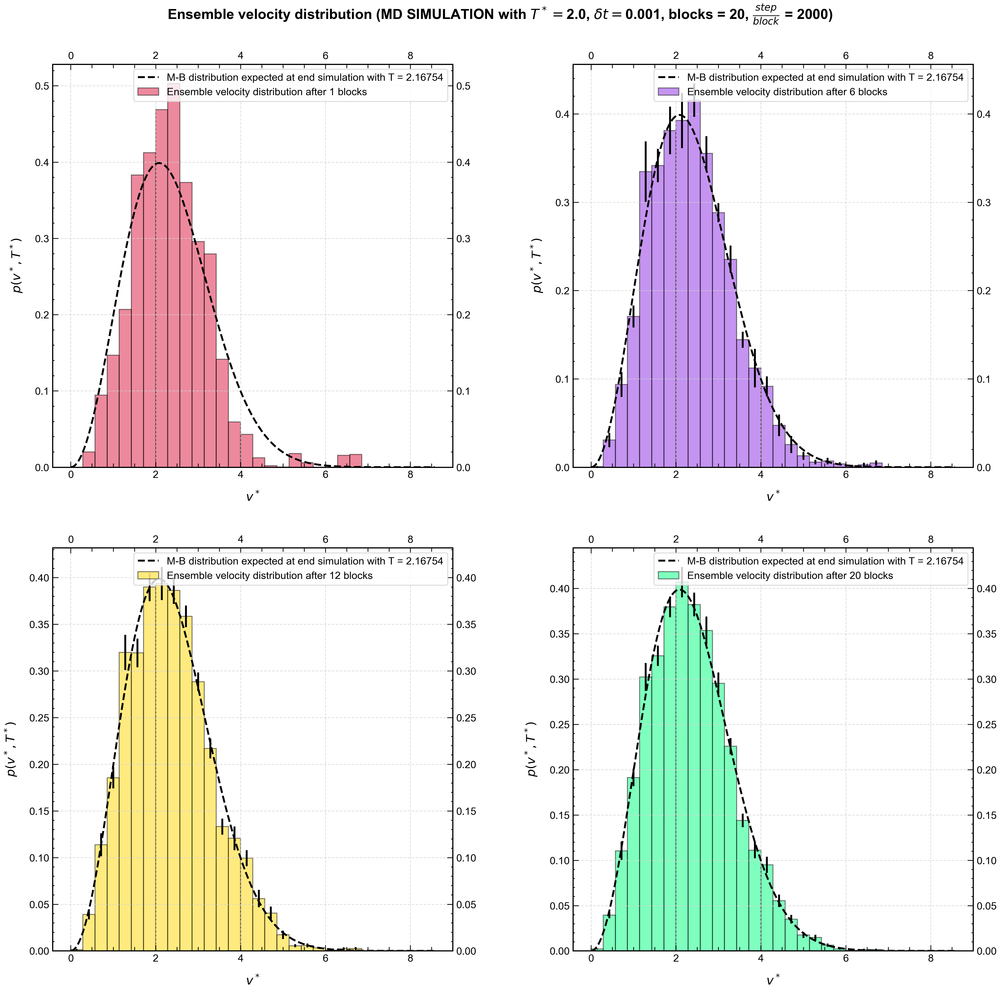

In [18]:
simulation_start_T = 2.0

path_to_file = "es_4.1/OUTPUT/"
 
max_boltz_sampl_v_max = 3.5 * np.sqrt(3.0 * simulation_start_T)
V = np.linspace(0, max_boltz_sampl_v_max, 300)  # Crea un array di velocità

# reading end simulation ensamble temperature 
with open(path_to_file + "temperature.dat", "r") as file :
    lines = file.readlines()
    simulation_end_T = float(lines[-1].strip().split()[-3]) # get 20th block mean temperature (-3 is the 2nd col of pofv.dat)

# max bolt distrib evaluation for T_end
MB = Max_Boltz_distr(V, simulation_end_T)

#loading data from pofv.data file
bin, counts, error = np.loadtxt(path_to_file + "pofv.dat", usecols = (1, 3, 4), unpack = True)
# histo colors list
color = ["crimson", "blueviolet", "gold", "springgreen"]
# index to value to plot
index = [0, 30, 150, 180, 330, 360, 570, 600]
blocks_plotted = [1, 6, 12, 20]

fig = plt.figure(figsize = (15, 15))

fig.suptitle(r"Ensemble velocity distribution (MD SIMULATION with $T^* = $" + str(simulation_start_T) + 
            r", $\delta t = $" + str(delta_t) + r", blocks = " + str(N_blocks) + 
            r", $\frac{step}{block}$ = " + str(N_step_per_block) + ")", fontsize = 15, fontweight = "bold")

for i in range(4) :

    plt.subplot(2, 2, i+1)
    
    #plt.bar() create an histo where bins value are a list of value imported from file
    plt.bar(bin[index[2*i] : index[2*i+1]],
            counts[index[2*i] : index[2*i+1]],
            width= 2*bin[0],
            yerr = error[index[2*i] : index[2*i+1]],
            ecolor = "black",
            alpha = 0.5,
            color = color[i],
            edgecolor = "black",
            label = "Ensemble velocity distribution after " + str(blocks_plotted[i]) + " blocks"
    )

    plt.plot(V, MB, color = "black", linestyle = "--", label = "M-B distribution expected at end simulation with T = " + str(simulation_end_T))

    plt.xlabel(r"$v^*$", labelpad = 12)
    plt.ylabel(r"$p(v^*, T^*)$", labelpad = 12)
    plt.legend(loc = "upper right")
    # plt.grid(True)

# Optimize the layout
plt.tight_layout()
plt.subplots_adjust(
    wspace=0.3,  # Spazio orizzontale
    hspace=0.2,  # Spazio verticale: default
    top=0.92     # move below plots (gives space to suptitle)
)

# Save plot
plt.savefig("es_4.1/plot/velocity_distribution.png")

# Display the plot
plt.show()

<h4>Conclusion</h4>

The Verlet algorithm is designed to **conserve** the **total internal energy ($E^*$)** of the system, characteristic of the microcanonical ($NVE$) ensemble. As a result, the **potential energy** ($U^*$) and **kinetic energy** ($K^*$) are not separately conserved quantities but fluctuate around their respective equilibrium mean values.

In MD simulations, systems are often initialized from an **ordered configuration** (such as an **FCC lattice**), even when simulating fluid phases. This practice is essential because randomly assigning particle positions carries a high, non-negligible probability of particle overlap ($r < \sigma$). Such overlaps would lead to an immediate rise in the potential energy due to the strong repulsive core of the Lennard-Jones potential, rendering the simulation non-physical.

Since the ordered initial configuration does not correspond to the true energy minimum for the target fluid phase, the system is initially in a **metastable state** with respect to the fluid's equilibrium. This configuration has a potential energy that is not characteristic of the equilibrium state.When the simulation begins, the interatomic forces act to destroy the low-entropy FCC order, allowing particles to reorganize into more stable configurations characteristic of the fluid phase. This **structural relaxation** is **associated** with a **decrease in the potential energy** ($U^*$). To maintain the conservation of total internal energy ($E^* = U^* + K^*$), the kinetic energy ($K^*$), and thus the temperature ($T^*$), must increase until the system reaches thermodynamic equilibrium. Due to this necessary thermalization period, the system ultimately settles at an effective equilibrium temperature ($T_{\text{eff}}^* = 2.16754$) that may slightly differ from the initial temperature used to assign velocities ($T_{\text{start}}^* = 2.0$).

The structural relaxation process is illustrated for all thermodynamic variables in the following plots.

To perform a meaningful comparison with the theoretical prediction, the **Maxwell-Boltzmann distribution** must be sampled using the **effective mean temperature** ($T_{\text{eff}}^*$) reached after the system has fully equilibrated.

The final plot compares the velocity distribution sampled from the last equilibrated block (including uncertainties) against the theoretical Maxwell-Boltzmann distribution computed using $T_{\text{eff}}^* = 2.16754$, which is the last block mean temperature (the one that describes better the system). The comparison demonstrates **excellent agreement** between the simulated velocity distribution and the theoretical prediction, thereby confirming that the system has successfully reached thermal equilibrium and adheres to the statistical mechanics framework.

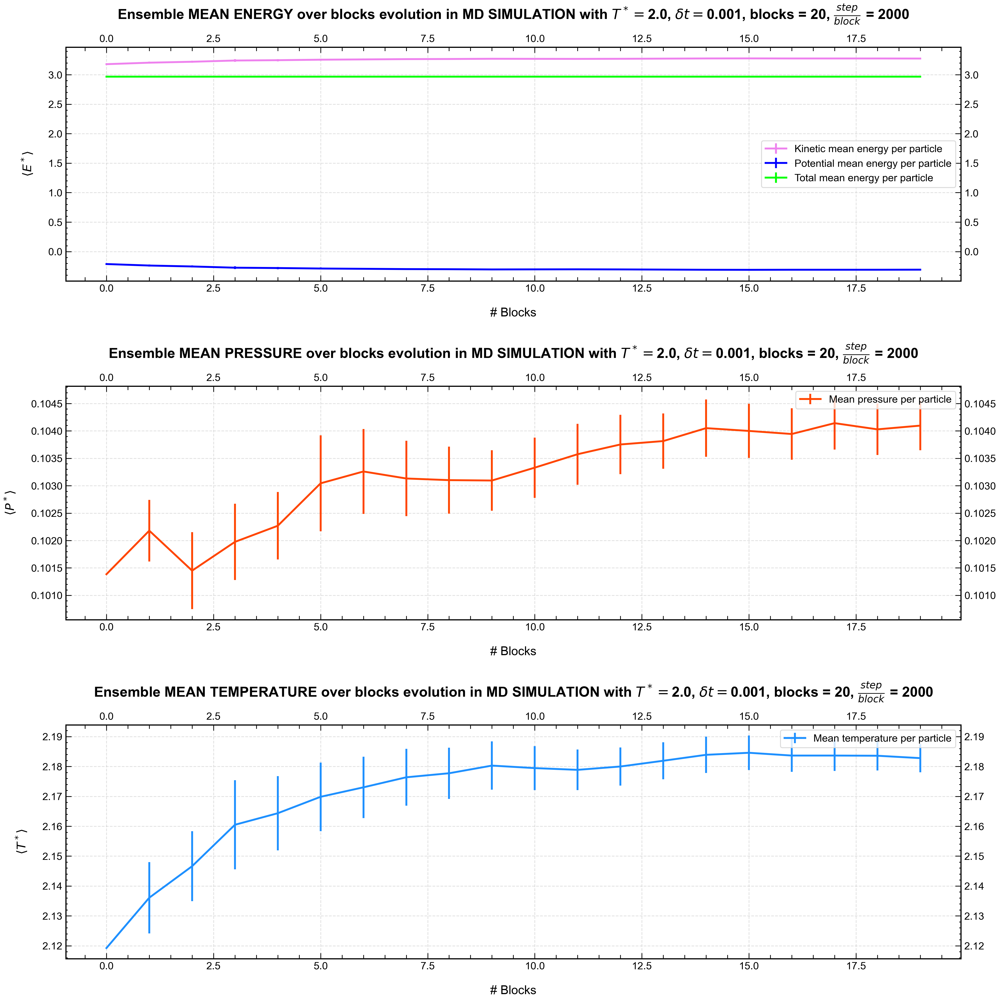

In [19]:
# Creating a list of filenames
file = ["kinetic_energy.dat", "potential_energy.dat", "total_energy.dat", "pressure.dat", "temperature.dat"]

# Creating the list of full file paths (ciclo for analogo ai cicli for di C++ con vector)
filename = [path_to_file + f for f in file]

X = np.arange(0, N_blocks)

# Titles and legends for the plots
titolo = ["MEAN ENERGY",
          "MEAN ENERGY",
          "MEAN ENERGY",
          "MEAN PRESSURE",
          "MEAN TEMPERATURE"]
legenda = ["Kinetic mean energy per particle", "Potential mean energy per particle", "Total mean energy per particle", "Mean pressure per particle", "Mean temperature per particle"]
yasse = [r"$\langle P^* \rangle$", r"$\langle T^* \rangle$"]
colore = ["violet", "blue", "lime", "orangered", "dodgerblue"]

# Creating the figure and axes
fig, axs = plt.subplots(3, 1, figsize=(15, 15))  # 3 rows, 1 column

for i in range(5):

    # Loading the data from the file
    val, error = np.loadtxt(filename[i], usecols = (2, 3), delimiter = None, unpack = True)

    # Plotting the data
    if i < 3:  # For energy plots
        axs[0].errorbar(X, val, yerr = error, color = colore[i], label = legenda[i])
        axs[0].set_title("Ensemble " + str(titolo[i]) + r" over blocks evolution in MD SIMULATION with $T^* = $" + 
                        str(simulation_start_T) + r", $\delta t = $" + str(delta_t) + r", blocks = " + str(N_blocks) + 
                        r", $\frac{step}{block}$ = " +  str(N_step_per_block), pad = 30)
        axs[0].set_xlabel("# Blocks", labelpad = 15)
        axs[0].set_ylabel(r"$\langle E^* \rangle$", labelpad = 15)
        # axs[0].grid(True)
        axs[0].legend()
    else:  # For pressure and temperature plots
        axs[i - 2].errorbar(X, val, yerr = error, color = colore[i], label = legenda[i])
        axs[i - 2].set_title("Ensemble " + str(titolo[i]) + r" over blocks evolution in MD SIMULATION with $T^* = $" + 
                            str(simulation_start_T) + r", $\delta t = $" + str(delta_t) + r", blocks = " + str(N_blocks) + 
                            r", $\frac{step}{block}$ = " +  str(N_step_per_block), pad = 30)
        axs[i - 2].set_xlabel("# Blocks", labelpad = 15)
        axs[i - 2].set_ylabel(yasse[i - 3], labelpad = 15)
        # axs[i - 2].grid(True)
        axs[i - 2].legend()

# Optimize the layout
plt.tight_layout()
plt.subplots_adjust(
    wspace=0.3,  # Spazio orizzontale
    hspace=0.45,  # Spazio verticale: default
    # top=0.92     # move below plots (gives space to suptitle)
)

# Save plot
plt.savefig("es_4.1/plot/thermodynamic_state_mean_variables.png")

# Display the plot
plt.show()

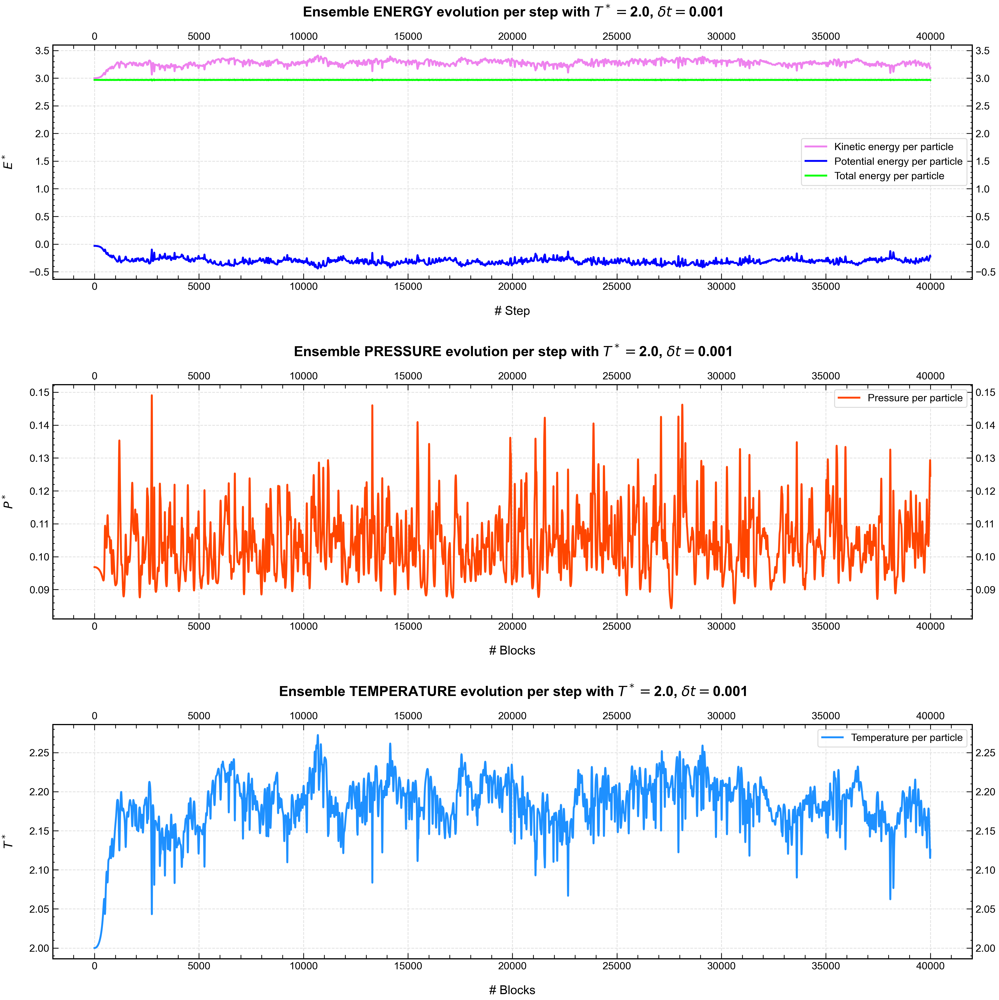

In [20]:
# Creating a list of filenames
file = ["kinetic_energy_step.dat", "potential_energy_step.dat", "total_energy_step.dat", "pressure_step.dat", "temperature_step.dat"]

# Creating the list of full file paths (ciclo for analogo ai cicli for di C++ con vector)
filename = [path_to_file + f for f in file]

X = np.arange(0, N_step_tot)

# Titles and legends for the plots
titolo = ["ENERGY",
          "ENERGY",
          "ENERGY",
          "PRESSURE",
          "TEMPERATURE"]
legenda = ["Kinetic energy per particle", "Potential energy per particle", "Total energy per particle", "Pressure per particle", "Temperature per particle"]
yasse = [r"$P^*$", r"$T^*$"]
colore = ["violet", "blue", "lime", "orangered", "dodgerblue"]

# Creating the figure and axes
fig, axs = plt.subplots(3, 1, figsize=(15, 15))  # 3 rows, 1 column

for i in range(5):

    # Loading the data from the file
    val = np.loadtxt(filename[i], delimiter = None)

    # Plotting the data
    if i < 3:  # For energy plots
        axs[0].plot(X, val, color = colore[i], label = legenda[i])
        axs[0].set_title("Ensemble " + str(titolo[i]) + r" evolution per step with $T^* = $" + 
                        str(simulation_start_T) + r", $\delta t = $" + str(delta_t), pad = 30)
        axs[0].set_xlabel("# Step", labelpad = 15)
        axs[0].set_ylabel(r"$E^*$", labelpad = 15)
        # axs[0].grid(True)
        axs[0].legend()
    else:  # For pressure and temperature plots
        axs[i - 2].plot(X, val, color = colore[i], label = legenda[i])
        axs[i - 2].set_title("Ensemble " + str(titolo[i]) + r" evolution per step with $T^* = $" + 
                            str(simulation_start_T) + r", $\delta t = $" + str(delta_t), pad = 30)
        axs[i - 2].set_xlabel("# Blocks", labelpad = 15)
        axs[i - 2].set_ylabel(yasse[i - 3], labelpad = 15)
        # axs[i - 2].grid(True)
        axs[i - 2].legend()

# Optimize the layout
plt.tight_layout()
plt.subplots_adjust()
plt.subplots_adjust(
    wspace=0.3,  # Spazio orizzontale
    hspace=0.45,  # Spazio verticale: default
    # top=0.92     # move below plots (gives space to suptitle)
)

# Save plot
plt.savefig("es_4.1/plot/thermodynamic_state_variables_per_step.png")

# Display the plot
plt.show()

<a id="from-dirac-to-max-boltz"></a>

<h2><span style="color:darkviolet">Evolution from Dirac $\delta$ velocity distribution</span></h2>

This section aims to perform a MD simulation using the Lennard-Jones model for a gas phase with **reduced density** $\rho^* = 0.05$ and **reduced temperature** $T^* = 2.0$. The simulation starts from a **low-entropy initial configuration** defined by:

1. Initial particle positions: An **FCC lattice** occupying half of the simulation box in each dimension.

2. Initial velocity distribution: A Dirac $\delta$ distribution, $p_\delta(v^*,T^*) = \delta\left( v^* - v_{T^*}\right)$, where $v_{T^*}$ is appropriately related to $T^*$.

The goal is to demonstrate how the system, despite starting from a spatial configuration far from the physically expected state, evolves during the simulation to reach the theoretical configuration of a gas, which is described by the Maxwell-Boltzmann distribution.

It is important to note that the system undergoes a **structural and thermal relaxation process** to reach the equilibrium configuration. Since we intend to simulate the gas phase at the **final effective temperature** $T_{\text{eff}}^* = 2.0$, I have chosen an initial temperature of $T_{\text{start}}^* = 2.72$. In this scenario, the system is **expected to equilibrate** at $T_{\text{eff}}^* \approx 2.0$ after approximately $7000$ step. Consequently, an **equilibration simulation** consisting of $10000$ steps was performed, **followed by the main simulation** starting from this equilibrated configuration.

<h4>Implementation Dirac $\delta$ velocity distribution</h4>

The implementation of the initial velocity distribution of the particle is handled within the `System::initialize_velocities()` method.

````cpp
    if(_dist_type == 1){
      ofstream coutpvs;
      coutpvs.open("../OUTPUT/initial_velocity_distribution.dat");
      coutpvs << "#      V_BIN_CENTER:             COUNTS:" << endl;
      double v_start{sqrt(3.0*_temp)} ;
      for(int i{}; i < _npart; i++){
        int resto = i % 6 ;
        if(resto == 0){
          vx(i) = v_start ;
          vy(i) = 0.0 ;
          vz(i) = 0.0 ;
        } else if(resto == 1){
          vx(i) = -v_start ;
          vy(i) = 0.0 ;
          vz(i) = 0.0 ;
        } else if(resto == 2){
          vx(i) = 0.0 ;
          vy(i) = v_start ;
          vz(i) = 0.0 ;
        } else if(resto == 3){
          vx(i) = 0.0 ;
          vy(i) = -v_start ;
          vz(i) = 0.0 ;
        } else if(resto == 4){
          vx(i) = 0.0 ;
          vy(i) = 0.0 ;
          vz(i) = v_start ;
        } else if(resto == 5){
          vx(i) = 0.0 ;
          vy(i) = 0.0 ;
          vz(i) = -v_start ;
        }
      }
      for (int i=0; i<_npart; i++){
        _particle(i).setvelocity(0, vx(i));
        _particle(i).setvelocity(1, vy(i));
        _particle(i).setvelocity(2, vz(i));
      }
      for(int k{}; k < _n_bins_v; k++){
        coutpvs << setw(20) << _bin_size_v * 0.5 + k * _bin_size_v
                << setw(20) << _measurement(_index_pofv + k) << endl;
      }
      coutpvs.close();
    }
````

The approach adopted involves associating each particle with a non-zero velocity component in only one direction. To achieve this, a loop iterates over the total number of particles, and the velocity components are set based on the remainder of the integer division between the particle index ($i$) and $6$ (representing the six possible positive and negative directions in 3D space). Specifically:
- If $i \pmod 6 = 0$: the $x$-component is set to $v_{\text{start}}$ and the others to zero.
- If $i \pmod 6 = 1$: the $x$-component is set to $-v_{\text{start}}$ and the others to zero.
- ...

$v_{\text{start}}$ is connected to the reduced temperature as follows:

$$\frac{(v^*)^2}{2} = \langle K^* \rangle = \frac{3T^*}{2} \implies v_{\text{start}} = \sqrt{3T_{\text{start}}^*}.$$

Since the total number of particle is 108, the **total momentum** of the system is automatically zero and thus no velocity rescaling is required.
The initial velocities are printed to an output file to represent the starting velocities distribution of the system.

The simulation was performed in two distinct phases using the parameters detailed below.



<h3><span style="color:darkviolet">Equilibration</span></h3>


<h4>INPUT values</h4>

The equilibration simulation was performed using the following input data.

<div align="center">

| Parameter | Value |
| :--- | :--- |
| `SIMULATION_TYPE`| 0 |
| `DISTRIBUTION_TYPE` | 1 |
| `RESTART` | 0 |
| `TEMP` | 2.72 |
| `NPART` | 108 |
| `RHO` | 0.05 |
| `R_CUT` | 5.0 |
| `DELTA` | 0.001 |
| `NBLOCKS` | 5 |
| `NSTEPS` | 2000 |

</div>

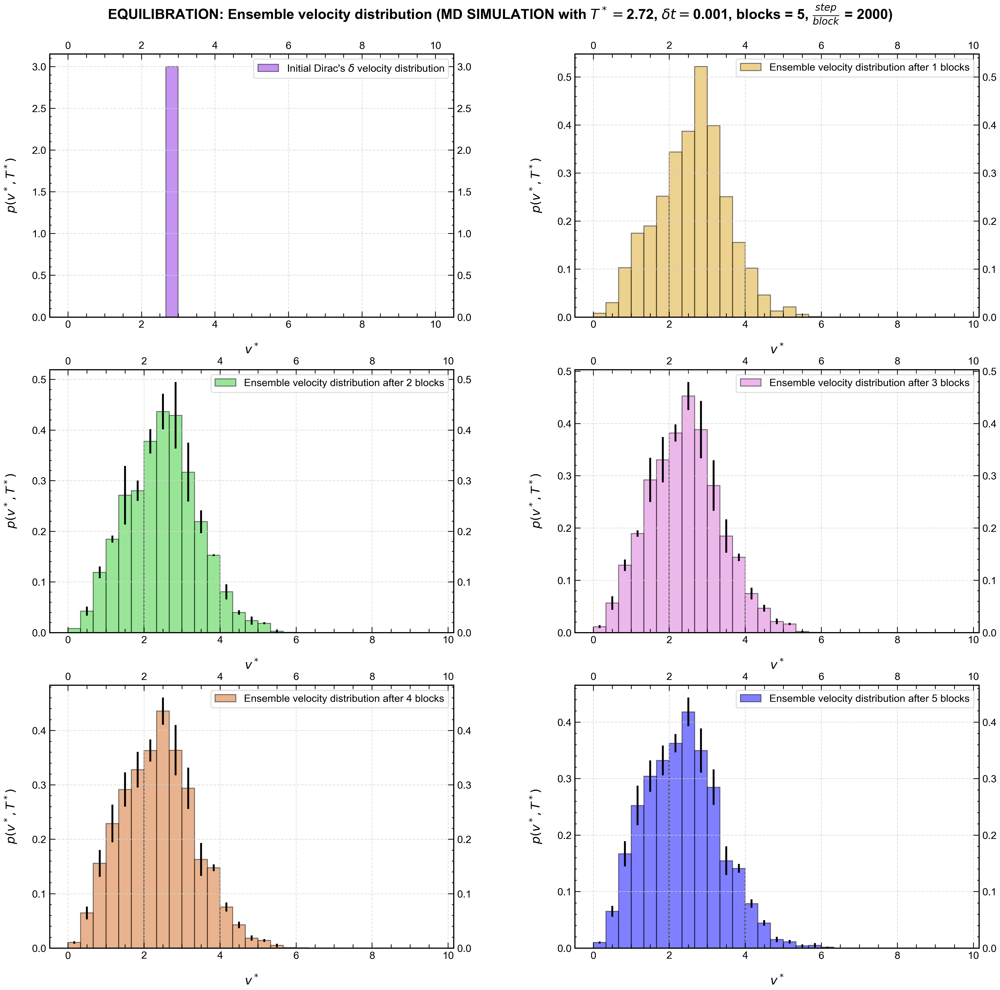

In [21]:
equilibration_start_T = 2.72
equilibration_start_v_dirac = np.sqrt(3.0 * equilibration_start_T)

path_to_file = "es_4.2/equilibration/OUTPUT/"

# # reading end simulation ensamble temperature 
# with open("es_4.2/equilibration/OUTPUT/temperature.dat", "r") as file :
#     lines = file.readlines()
#     equilibration_end_T = float(lines[-1].strip().split()[-3]) # get last mean temperature

# # max velocity to sample maxwell boltzmann ensamble velocity distribution
# max_boltz_sampl_v_max = 3.5 * np.sqrt(3.0 * equilibration_start_T)

# # velocity list to create maxwell boltzmann distribution
# v = np.linspace(0, max_boltz_sampl_v_max, 100)

# # maxwell bolzmann value
# MB = Max_Boltz_distr(v, equilibration_end_T)

# import data from pofv.dat file to plot ensamble velocity distribution
bin, counts, error = np.loadtxt(path_to_file + "pofv.dat", usecols = (1,3,4), delimiter = None, unpack = True)
bin2, counts2 = np.loadtxt(path_to_file + "initial_velocity_distribution.dat", usecols = (0,1), delimiter = None, unpack = True)

# import initial configuration
# histo color list
colore = ["blueviolet", "goldenrod", "limegreen", "orchid", "chocolate", "blue"]

# index to value to plot
index = [0, 29, 30, 59, 60, 89, 90, 119, 120, 149]
blocks_plotted = [1, 2, 3, 4, 5]
# create a figure
fig, axs = plt.subplots(3,2,figsize=(15, 15))
# figure title
fig.suptitle(r"EQUILIBRATION: Ensemble velocity distribution (MD SIMULATION with $T^* = $" + str(equilibration_start_T) + 
        r", $\delta t = $" + str(delta_t) + r", blocks = " + str(N_blocks_equilibration) + 
        r", $\frac{step}{block}$ = " +  str(N_step_per_block) + ")", fontweight = "bold", fontsize = 15)

# for loop to create histog
for i in range(6) :
    row = i // 2
    col = i % 2

    if i == 0 : # plotting dirac delta velocity distribution
        axs[row][col].bar(bin2[0:30], counts2[0:30],
                            width = 2 * bin2[0], alpha = 0.5,
                            color = colore[i], edgecolor = "black",
                            label = r"Initial Dirac's $\delta$ velocity distribution"
                            )

    else :  # plotting histograms counts in each velocity bin after 1, 2, 3, 4, 5 blocks
        axs[row][col].bar(bin[index[2*(i-1)] : index[2*(i-1)+1]],
                            counts[index[2*(i-1)] : index[2*(i-1)+1]],
                            width = 2 * bin[0],
                            yerr = error[index[2*(i-1)]: index[2*(i-1)+1]],
                            ecolor = "black",
                            alpha = 0.5,
                            color = colore[i],
                            edgecolor = "black",
                            label = "Ensemble velocity distribution after " + str(blocks_plotted[i-1]) + " blocks"
                            )

    # plotting final max boltz velocity distribution 
    # axs[row][col].plot(v, MB, color = "black", label = "Maxwell-Boltzmann distribution expected at end equilibration with T = " +
    #                     str(equilibration_end_T))

    # axis label setting
    axs[row][col].set_xlabel(r"$v^*$", labelpad = 15)
    axs[row][col].set_ylabel(r"$p(v^*, T^*)$", labelpad = 15)

    # grid setting
    # axs[row][col].grid(True)

    # legend setting
    axs[row][col].legend()


# Optimize the layout
plt.tight_layout()
plt.subplots_adjust(
    wspace=0.3,  # Spazio orizzontale
    hspace=0.2,  # Spazio verticale: default
    top=0.93     # move below plots (gives space to suptitle)
)
# Save plot
plt.savefig("es_4.2/equilibration/plot/velocity_distribution.png")
# Display the plot
plt.show()

Even after five blocks ($10000$ steps), the **ensemble exhibits high counts in the velocity bin corresponding to the starting configuration**. This phenomenon is directly associated with the choice of the initial temperature $T_{\text{start}}^*=2.72$, which is only $\Delta T^*=0.72$ higher than the final target temperature $T^*=2.0$. In a reduced units system where $k_B=1$ and particle mass $m=1$, the root-mean-square (RMS) velocity, which is a measure of the typical velocity for an ideal gas at equilibrium, is given by $v_{\text{rms}} = \sqrt{3T^*}$.

For the target temperature $T^*=2.0$, we have 

$$v_{\text{rms}} \approx \sqrt{3 \times 2.0} \approx 2.45.$$

The proximity of the most probable speed (or RMS velocity) of the final Maxwell-Boltzmann distribution to the initial velocity of the $\delta$-Dirac configuration ($v_{T^*}=\sqrt{3T_{\text{start}}^*}$) results in the **overlap of their respective bins**. This causes the system to appear to retain "memory" of the initial velocity distribution even after significant relaxation, as the equilibrium peak falls into the same coarse-grained bin.

The following figures provide further insight into the **ensemble's relaxation process**. As the simulation begins, the system undergoes both a **structural expansion** (starting from a high-density FCC lattice occupying half the volume) and a subsequent **cooling process** (the temperature decreases as the kinetic energy is converted into potential energy due to the expansion against repulsive forces). As previously stated, the system is observed to reach an equilibrated configuration after approximately 5,000 time steps. To ensure **full stability** and **robust sampling**, the equilibration phase was conservatively extended to the $10,000^{\text{th}}$ step, at which point all measured thermodynamic parameters exhibit stochastic fluctuations around a **time-independent mean value**, confirming the attainment of thermal equilibrium.

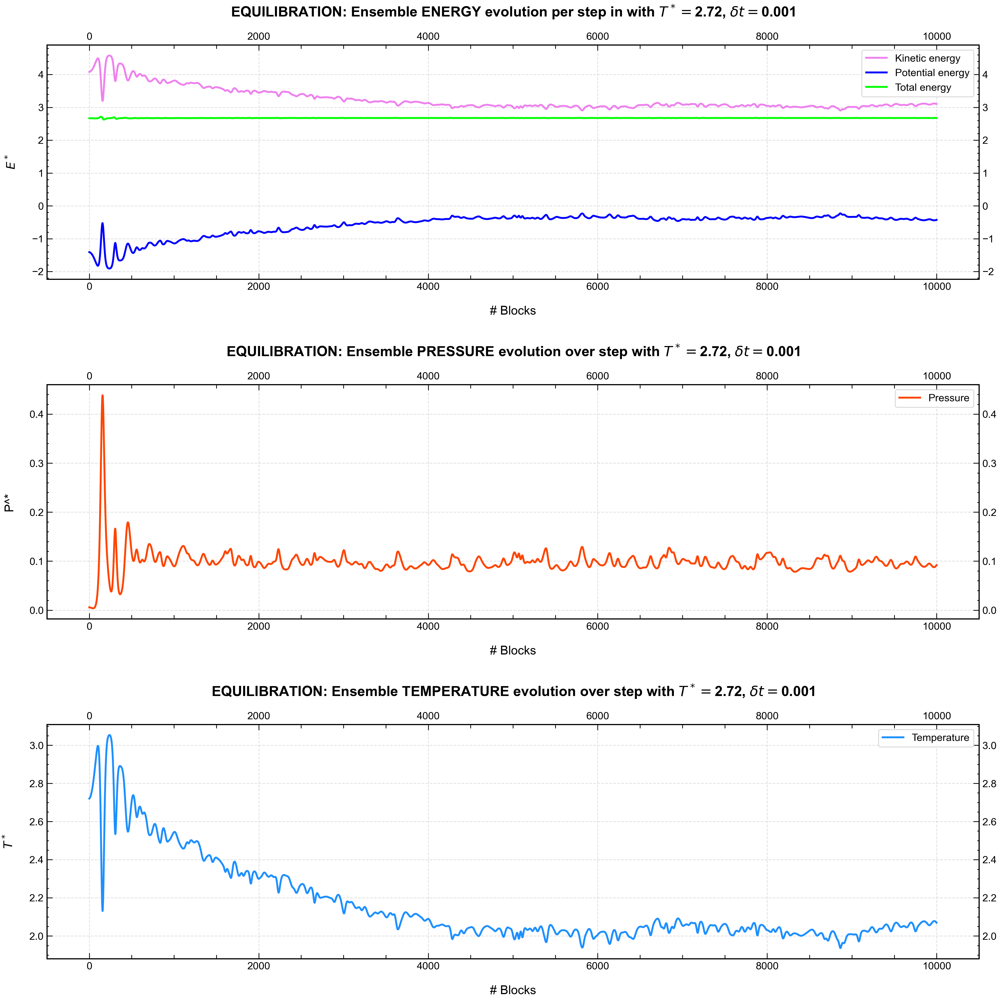

In [22]:
# Creating a list of filenames
file = ["kinetic_energy_step.dat", "potential_energy_step.dat", "total_energy_step.dat", "pressure_step.dat", "temperature_step.dat"]

# Creating the list of full file paths (ciclo for analogo ai cicli for di C++ con vector)
filename = [path_to_file + f for f in file]

X = np.arange(0, N_step_tot_equilibration)

# Titles and legends for the plots
titolo = ["ENERGY",
          "ENERGY",
          "ENERGY",
          "PRESSURE",
          "TEMPERATURE"]
legenda = ["Kinetic energy", "Potential energy", "Total energy", "Pressure", "Temperature"]
yasse = [r"P^*", r"$T^*$"]
colore = ["violet", "blue", "lime", "orangered", "dodgerblue"]

# Creating the figure and axes
fig, axs = plt.subplots(3, 1, figsize=(15, 15))  # 3 rows, 1 column

for i in range(5):

    # Loading the data from the file
    val = np.loadtxt(filename[i])

    # Plotting the data
    if i < 3:  # For energy plots
        axs[0].set_title("EQUILIBRATION: Ensemble " + str(titolo[i]) + r" evolution per step in with $T^* = $" + 
                        str(equilibration_start_T) + r", $\delta t = $" + str(delta_t), fontsize = 15, pad = 30)
        axs[0].set_xlabel("# Blocks", labelpad = 15)
        axs[0].set_ylabel(r"$E^*$", labelpad = 15)
        axs[0].plot(X, val, color = colore[i], label = legenda[i])
        # axs[0].grid(True)
        axs[0].legend()
    else:  # For pressure and temperature plots
        axs[i - 2].plot(X, val, color = colore[i], label = legenda[i])
        axs[i - 2].set_title("EQUILIBRATION: Ensemble " + str(titolo[i]) + r" evolution over step with $T^* = $" + 
                            str(equilibration_start_T) + r", $\delta t = $" + str(delta_t), fontsize = 15, pad = 30)
        axs[i - 2].set_xlabel("# Blocks", labelpad = 15)
        axs[i - 2].set_ylabel(yasse[i - 3], labelpad = 15)
        # axs[i - 2].grid(True)
        axs[i - 2].legend()

# Optimize the layout
plt.tight_layout()
plt.subplots_adjust(
    wspace=0.3,  # Spazio orizzontale
    hspace=0.45,  # Spazio verticale: default
    # top=0.92     # move below plots (gives space to suptitle)
)

# Save plot
plt.savefig("es_4.2/equilibration/plot/thermodynamic_state_variables_per_step.png")
# Display the plot
plt.show()

<h4>Conclusion</h4>

The initial state, defined by the highly ordered Dirac $\delta$ velocity distribution, quickly **relaxes** towards the more characteristic Maxwell-Boltzmann ensemble. This evolution illustrates the **Second Law of Thermodynamics**, which asserts that **isolated systems evolve spontaneously from low-probability, low-entropy configurations** (highly ordered) **to more probable, high-entropy states** (disordered equilibrium). 

The concept of time reversal in Molecular Dynamics requires careful phrasing. Molecular Dynamics (MD) is intrinsically **time-reversible** because the underlying equations of motion (Newton's laws) are symmetric with respect to time reversal ($t \to -t$). However, the **thermodynamic evolution is not**:

- If the system starts from a low-entropy configuration (as in the initial phase of this simulation), both the forward and backward evolutions in time will lead to states of higher entropy, as the system tends to maximize its probability of existence in the vast phase space.

- If the system is already at equilibrium, a time-reversed trajectory will still lead to states that fluctuate around the same high-entropy mean, exploring highly probable configurations in the phase space. The system remains in an equilibrium ensemble.

<h3><span style="color:darkviolet">Equilibrium simulation</span></h3>

Following the completion of the equilibration phase, the **main run** was initiated from the last recorded configuration. The starting temperature for this run was defined by the mean temperature of the final equilibration block, $T_{\text{start}}^* = 2.02586$. Since the simulation is **restarted** from an experimental configuration obtained in a preceding run (`RESTART` $= 1$), the `NSL_SIMULATOR` code bypasses the need for a **new initial velocity distribution**. Instead, the Verlet integration algorithm is initialized by reading the **system's last two position configurations**. The most recent configuration is set as the current time configuration ($\mathbf{r}(t)$), and the previous one is set as the configuration at time $t - \delta t$ ($\mathbf{r}(t-\delta t)$).

<h4>INPUT values</h4>

The real simulation was performed using the following data.

<div align="center">

| Parameter | Value |
| :--- | :--- |
| `SIMULATION_TYPE`| 0 |
| `DISTRIBUTION_TYPE` | 0 |
| `RESTART` | 1 |
| `TEMP` | 2.02586 |
| `NPART` | 108 |
| `RHO` | 0.05 |
| `R_CUT` | 5.0 |
| `DELTA` | 0.001 |
| `NBLOCKS` | 20 |
| `NSTEPS` | 2000 |


</div>

**NB**: the temperature used in the main simulation is the mean value of the the last block of the equilibration simulation.

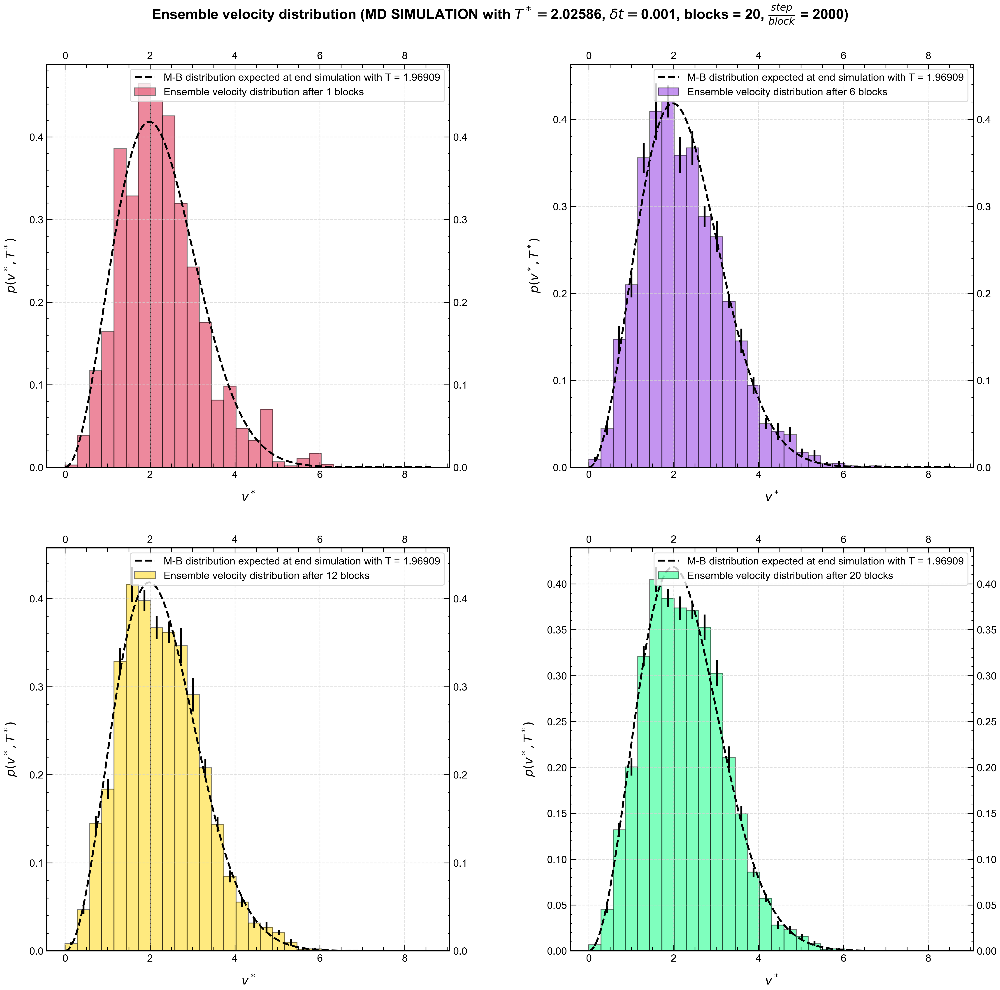

In [23]:
simulation_start_T = 2.02586
 
max_boltz_sampl_v_max = 3.5 * np.sqrt(3.0 * simulation_start_T)
V = np.linspace(0, max_boltz_sampl_v_max, 300)  # Crea un array di velocità

path_to_file = "es_4.2/simulation/OUTPUT/"

# reading end simulation ensamble temperature 
with open(path_to_file + "temperature.dat", "r") as file :
    lines = file.readlines()
    simulation_end_T = float(lines[-1].strip().split()[-3]) # get 20th block mean temperature

# max bolt distrib evaluation for T_end
MB = Max_Boltz_distr(V, simulation_end_T)

#loading data from pofv.data file
bin, counts, error = np.loadtxt(path_to_file + "pofv.dat", usecols = (1, 3, 4), unpack = True)
# histo colors list
color = ["crimson", "blueviolet", "gold", "springgreen"]
# index to value to plot
index = [0, 30, 150, 180, 330, 360, 570, 600]
blocks_plotted = [1, 6, 12, 20]

fig = plt.figure(figsize = (15, 15))

fig.suptitle(r"Ensemble velocity distribution (MD SIMULATION with $T^* = $" + str(simulation_start_T) + 
            r", $\delta t = $" + str(delta_t) + r", blocks = " + str(N_blocks) + 
            r", $\frac{step}{block}$ = " + str(N_step_per_block) + ")", fontsize = 15, fontweight = "bold")

for i in range(4) :

    plt.subplot(2, 2, i+1)
    
    #plt.bar() create an histo where bins value are a list of value imported from file
    plt.bar(bin[index[2*i] : index[2*i+1]],
            counts[index[2*i] : index[2*i+1]],
            width= 2*bin[0],
            yerr = error[index[2*i] : index[2*i+1]],
            ecolor = "black",
            alpha = 0.5,
            color = color[i],
            edgecolor = "black",
            label = "Ensemble velocity distribution after " + str(blocks_plotted[i]) + " blocks"
    )

    plt.plot(V, MB, color = "black", linestyle = "--", label = "M-B distribution expected at end simulation with T = " + str(simulation_end_T))

    plt.xlabel(r"$v^*$", labelpad = 12)
    plt.ylabel(r"$p(v^*, T^*)$", labelpad = 12)
    plt.legend(loc="upper right")
    # plt.grid(True)

# Optimize the layout
plt.tight_layout()
plt.subplots_adjust(
    wspace=0.3,  # Spazio orizzontale
    hspace=0.2,  # Spazio verticale: default
    top=0.92     # move below plots (gives space to suptitle)
)

# Save plot
plt.savefig("es_4.2/simulation/plot/velocity_distribution.png")

# Display the plot
plt.show()

<h4>Conclusion</h4>

The plot illustrating the evolution of the velocity distribution confirms that the system maintains a distribution characteristic of the Maxwell-Boltzmann ensemble throughout the simulation. This stability is expected, as the system had already undergone a comprehensive equilibration phase. The **distribution now fluctuates stochastically around the characteristic equilibrium shape**, without exhibiting any systematic changes.

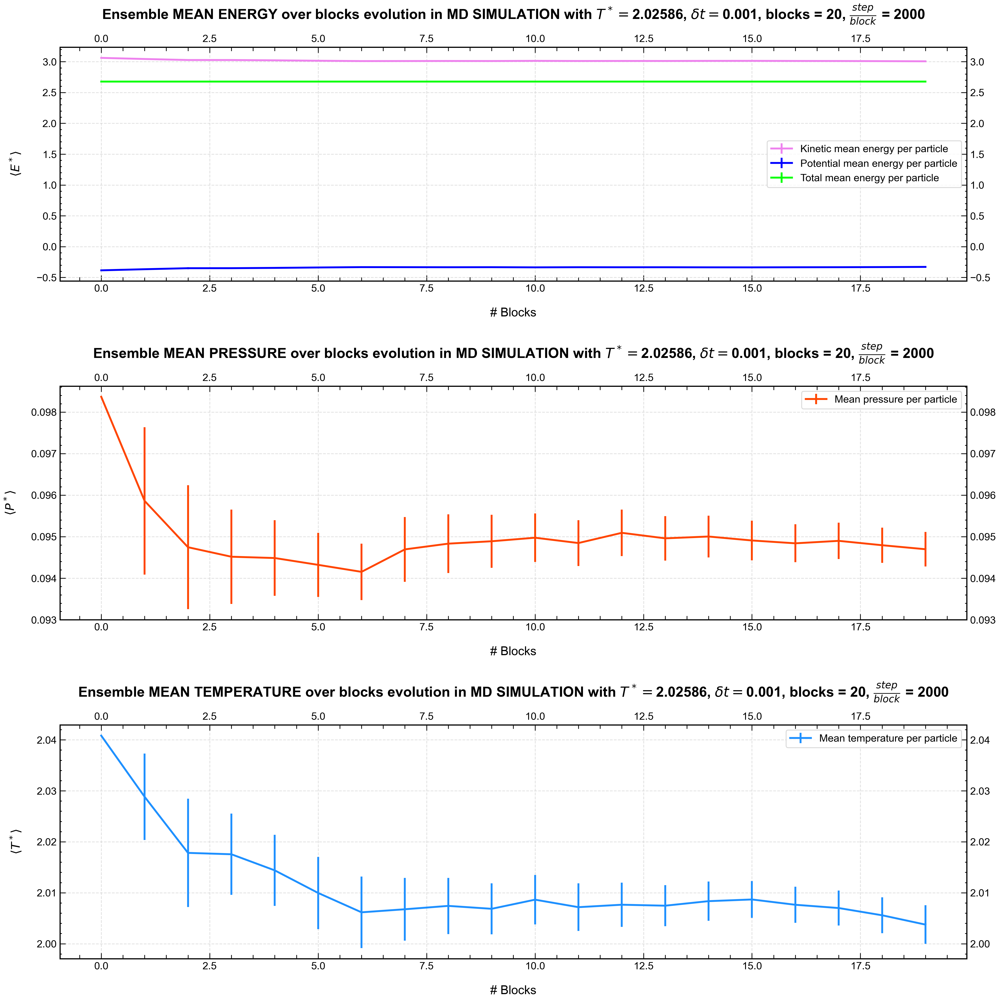

In [24]:
# Creating a list of filenames
file = ["kinetic_energy.dat", "potential_energy.dat", "total_energy.dat", "pressure.dat", "temperature.dat"]

# Creating the list of full file paths (ciclo for analogo ai cicli for di C++ con vector)
filename = [path_to_file + f for f in file]

X = np.arange(0, N_blocks)

# Titles and legends for the plots
titolo = ["MEAN ENERGY",
          "MEAN ENERGY",
          "MEAN ENERGY",
          "MEAN PRESSURE",
          "MEAN TEMPERATURE"]
legenda = ["Kinetic mean energy per particle", "Potential mean energy per particle", "Total mean energy per particle", "Mean pressure per particle", "Mean temperature per particle"]
yasse = [r"$\langle P^* \rangle$", r"$\langle T^* \rangle$"]
colore = ["violet", "blue", "lime", "orangered", "dodgerblue"]

# Creating the figure and axes
fig, axs = plt.subplots(3, 1, figsize=(15, 15))  # 3 rows, 1 column

for i in range(5):

    # Loading the data from the file
    val, error = np.loadtxt(filename[i], usecols = (2, 3), delimiter = None, unpack = True)

    # Plotting the data
    if i < 3:  # For energy plots
        axs[0].set_title("Ensemble " + str(titolo[i]) + r" over blocks evolution in MD SIMULATION with $T^* = $" + 
                        str(simulation_start_T) + r", $\delta t = $" + str(delta_t) + r", blocks = " + str(N_blocks) + 
                        r", $\frac{step}{block}$ = " +  str(N_step_per_block), fontsize = 15, pad = 30)
        axs[0].set_xlabel("# Blocks", labelpad = 15)
        axs[0].set_ylabel(r"$\langle E^* \rangle$", labelpad = 15)
        axs[0].errorbar(X, val, yerr = error, color = colore[i], label = legenda[i])
        # axs[0].grid(True)
        axs[0].legend()
    else:  # For pressure and temperature plots
        axs[i - 2].set_title("Ensemble " + str(titolo[i]) + r" over blocks evolution in MD SIMULATION with $T^* = $" + 
                            str(simulation_start_T) + r", $\delta t = $" + str(delta_t) + r", blocks = " + str(N_blocks) + 
                            r", $\frac{step}{block}$ = " +  str(N_step_per_block), fontsize = 15, pad = 30)
        axs[i - 2].errorbar(X, val, yerr = error, color = colore[i], label = legenda[i])
        axs[i - 2].set_xlabel("# Blocks", labelpad = 15)
        axs[i - 2].set_ylabel(yasse[i - 3], labelpad = 15)
        # axs[i - 2].grid(True)
        axs[i - 2].legend()

# Optimize the layout
plt.tight_layout()
plt.subplots_adjust(
    wspace=0.3,  # Spazio orizzontale
    hspace=0.45,  # Spazio verticale: default
    # top=0.92     # move below plots (gives space to suptitle)
)

# Save plot
plt.savefig("es_4.2/simulation/plot/thermodynamic_state_mean_variables.png")
# Display the plot
plt.show()

<h4>Conclusion</h4>

The evolution of the block averages for the main thermodynamic properties (e.g., potential energy, pressure) demonstrates the expected convergence behavior. A **slight initial variation** in the average values can be attributed to statistical fluctuations inherent in the early blocks. Crucially, as the number of blocks increases, the **cumulative averages become increasingly stable**, converging towards a definitive, time-independent mean value. This convergence confirms that the collected data are statistically reliable for subsequent analysis.

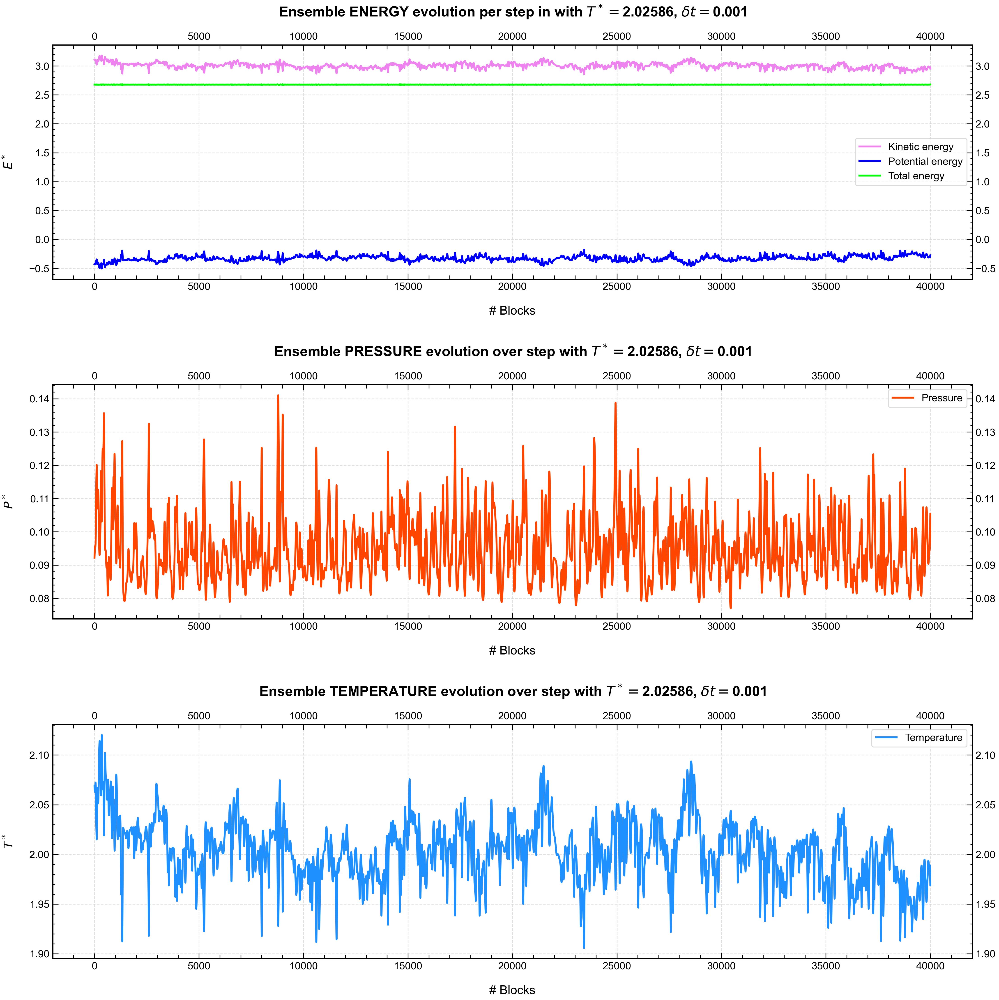

In [25]:
# Creating a list of filenames
file = ["kinetic_energy_step.dat", "potential_energy_step.dat", "total_energy_step.dat", "pressure_step.dat", "temperature_step.dat"]

# Creating the list of full file paths (ciclo for analogo ai cicli for di C++ con vector)
filename = [path_to_file + f for f in file]

X = np.arange(0, N_step_tot)

# Titles and legends for the plots
titolo = ["ENERGY",
          "ENERGY",
          "ENERGY",
          "PRESSURE",
          "TEMPERATURE"]
legenda = ["Kinetic energy", "Potential energy", "Total energy", "Pressure", "Temperature"]
yasse = [r"$P^*$", r"$T^*$"]
colore = ["violet", "blue", "lime", "orangered", "dodgerblue"]

# Creating the figure and axes
fig, axs = plt.subplots(3, 1, figsize=(15, 15))  # 3 rows, 1 column

for i in range(5):

    # Loading the data from the file
    val = np.loadtxt(filename[i])

    # Plotting the data
    if i < 3:  # For energy plots
        axs[0].set_title("Ensemble " + str(titolo[i]) + r" evolution per step in with $T^* = $" + 
                        str(simulation_start_T) + r", $\delta t = $" + str(delta_t), fontsize = 15, pad = 30)
        axs[0].set_xlabel("# Blocks", labelpad = 15)
        axs[0].set_ylabel(r"$E^*$", labelpad = 15)
        axs[0].plot(X, val, color = colore[i], label = legenda[i])
        # axs[0].grid(True)
        axs[0].legend()
    else:  # For pressure and temperature plots
        axs[i - 2].plot(X, val, color = colore[i], label = legenda[i])
        axs[i - 2].set_title("Ensemble " + str(titolo[i]) + r" evolution over step with $T^* = $" + 
                            str(simulation_start_T) + r", $\delta t = $" + str(delta_t), fontsize = 15, pad = 30)
        axs[i - 2].set_xlabel("# Blocks", labelpad = 15)
        axs[i - 2].set_ylabel(yasse[i - 3], labelpad = 15)
        # axs[i - 2].grid(True)
        axs[i - 2].legend()

# Optimize the layout
plt.tight_layout()
plt.subplots_adjust(
    wspace=0.3,  # Spazio orizzontale
    hspace=0.45,  # Spazio verticale: default
    # top=0.92     # move below plots (gives space to suptitle)
)

# Save plot
plt.savefig("es_4.2/simulation/plot/thermodynamic_state_variables_per_step.png")
# Display the plot
plt.show()

<h4>Conclusion</h4>

The instantaneous values of the main thermodynamic properties further validate that the system is operating in a state of **dynamic equilibrium**. **No systematic drift** of the quantities is observable; rather, the properties exhibit only **stochastic fluctuations** around their time-independent mean values. This confirms the successful attainment and maintenance of the equilibrium configuration from the onset of the production run.

<a id="time-reverse-simulation"></a>

<h2><span style="color:darkviolet">Time Reversal simulation</span></h2>

In this section, we aim to invert the simulation to return to the low-entropy initial configuration described in Section 4.2. To achieve this, we will utilize the last two configuration output files generated during the equilibration run. Specifically, the file `OUTPUT/conf-1.xyz`, corresponding to the second-to-last step of the equilibration run, is copied to `INPUT/config.xyz` to define the system's initial configuration ($\mathbf{r}(t)$) for the backward simulation. Conversely, the file `OUTPUT/config.xyz`, which holds the final configuration of the previous simulation, is copied to `INPUT/conf-1.xyz` to represent the configuration at the previous timestep ($\mathbf{r}(t-\Delta t)$). 

This procedure is a standard technique for leveraging the time-symmetry of the Verlet algorithm. Since the standard **Verlet scheme** does **not** explicitly **track velocities**, it is not possible to simply invert them. Instead, defining the positions at $t$ and $t-\Delta t$ effectively sets the initial (reversed) velocity required for the integration to proceed backward in time.

The starting temperature for the inverted run is set equal to the last block average temperature of the equilibration run, $T_{\text{start}}^* = \langle T^* \rangle_{\text{last block}} = 2.02586$.

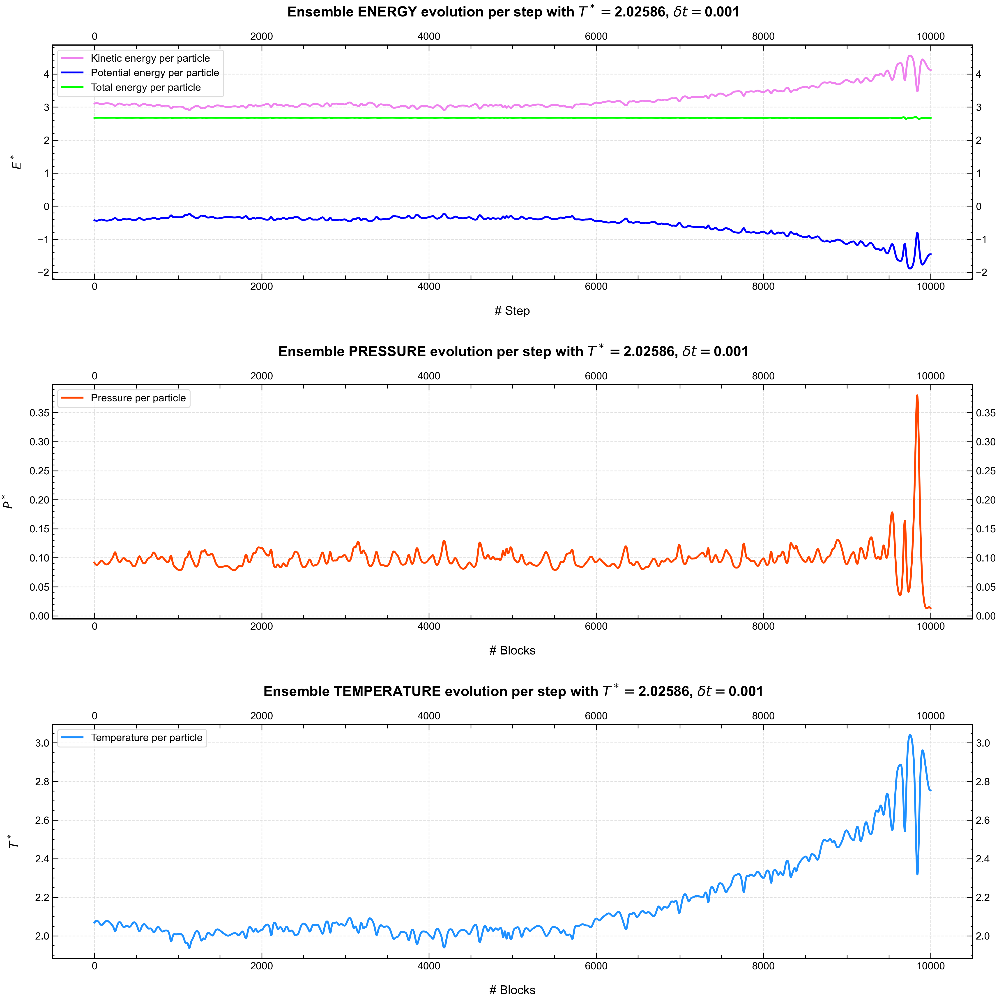

In [26]:
# Creating a list of filenames
path_to_file = "es_4.3/back_1/OUTPUT/"
file = ["kinetic_energy_step.dat", "potential_energy_step.dat", "total_energy_step.dat", "pressure_step.dat", "temperature_step.dat"]

# Creating the list of full file paths (ciclo for analogo ai cicli for di C++ con vector)
filename = [path_to_file + f for f in file]

X = np.arange(0, N_step_tot_equilibration)

# Titles and legends for the plots
titolo = ["ENERGY",
          "ENERGY",
          "ENERGY",
          "PRESSURE",
          "TEMPERATURE"]
legenda = ["Kinetic energy per particle", "Potential energy per particle", "Total energy per particle", "Pressure per particle", "Temperature per particle"]
yasse = [r"$P^*$", r"$T^*$"]
colore = ["violet", "blue", "lime", "orangered", "dodgerblue"]

# Creating the figure and axes
fig, axs = plt.subplots(3, 1, figsize=(15, 15))  # 3 rows, 1 column

for i in range(5):

    # Loading the data from the file
    val = np.loadtxt(filename[i], delimiter = None)

    # Plotting the data
    if i < 3:  # For energy plots
        axs[0].plot(X, val, color = colore[i], label = legenda[i])
        axs[0].set_title("Ensemble " + str(titolo[i]) + r" evolution per step with $T^* = $" + 
                        str(simulation_start_T) + r", $\delta t = $" + str(delta_t), pad = 30)
        axs[0].set_xlabel("# Step", labelpad = 15)
        axs[0].set_ylabel(r"$E^*$", labelpad = 15)
        # axs[0].grid(True)
        axs[0].legend()
    else:  # For pressure and temperature plots
        axs[i - 2].plot(X, val, color = colore[i], label = legenda[i])
        axs[i - 2].set_title("Ensemble " + str(titolo[i]) + r" evolution per step with $T^* = $" + 
                            str(simulation_start_T) + r", $\delta t = $" + str(delta_t), pad = 30)
        axs[i - 2].set_xlabel("# Blocks", labelpad = 15)
        axs[i - 2].set_ylabel(yasse[i - 3], labelpad = 15)
        # axs[i - 2].grid(True)
        axs[i - 2].legend()

# Optimize the layout
plt.tight_layout()
plt.subplots_adjust(
    wspace=0.3,  # Spazio orizzontale
    hspace=0.45,  # Spazio verticale: default
    # top=0.92     # move below plots (gives space to suptitle)
)

# Save plot
plt.savefig("es_4.3/back_1/plot/thermodynamic_state_variables_per_step.png")

# Display the plot
plt.show()

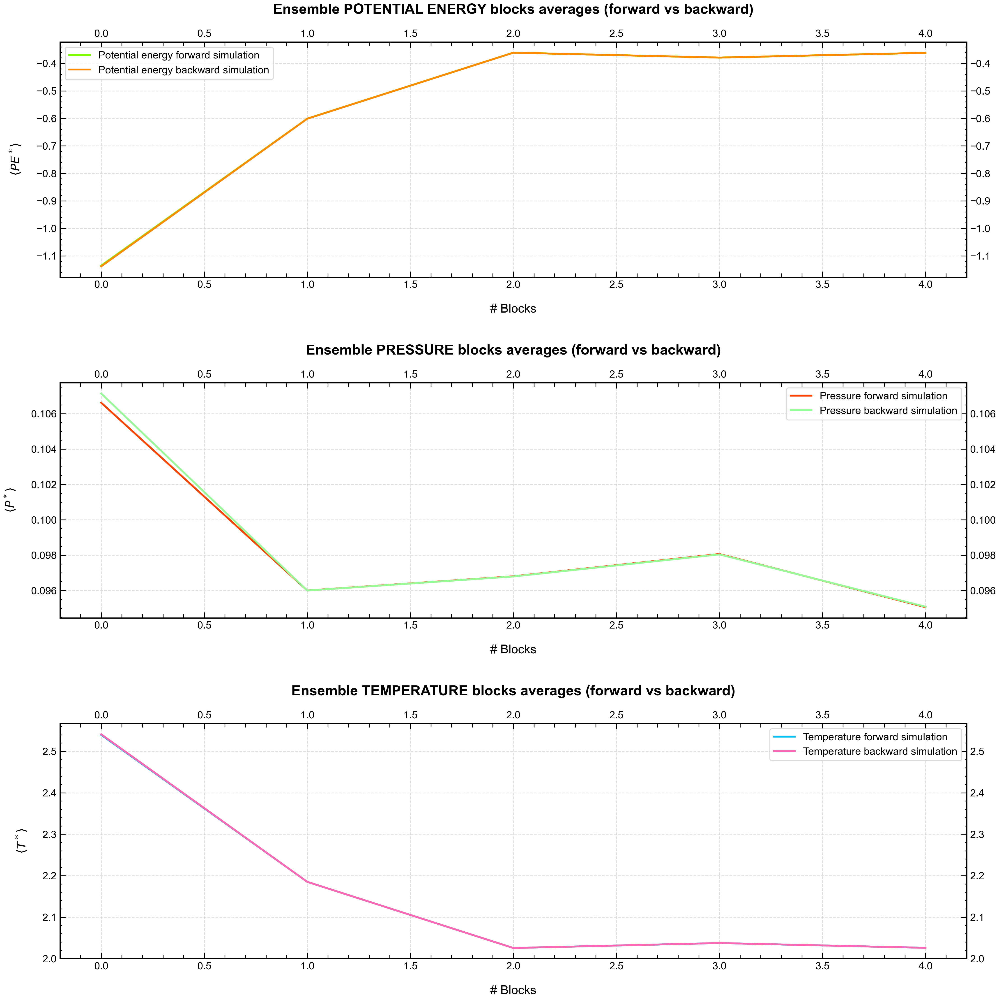

In [27]:
path_to_file_backward = "es_4.3/back_1/OUTPUT/"
# path_to_file_forward = "es_4.2/simulation/OUTPUT/"
path_to_file_forward = "es_4.2/equilibration/OUTPUT/"
file = ["potential_energy.dat", "pressure.dat", "temperature.dat"]

# Creating the list of full file paths (ciclo for analogo ai cicli for di C++ con vector)
filename_backward = [path_to_file_backward + f for f in file]
filename_forward = [path_to_file_forward + f for f in file]

X_fw = np.arange(0, N_blocks_equilibration)
X_bw = np.flip(X_fw)

# Titles and legends for the plots
titolo = ["POTENTIAL ENERGY",
          "PRESSURE",
          "TEMPERATURE"]
legenda_backward = ["Potential energy backward simulation", "Pressure backward simulation", "Temperature backward simulation"]
legenda_forward = ["Potential energy forward simulation", "Pressure forward simulation", "Temperature forward simulation"]
yasse = [r"$\langle PE^* \rangle$", r"$\langle P^* \rangle$", r"$\langle T^* \rangle$"]
# Colori per la simulazione indietro nel tempo
colore_backward = ["darkorange", "palegreen", "hotpink"]
# Colori per la simulazione in avanti nel tempo
colore_forward = ["lawngreen", "orangered", "deepskyblue"]

# Creating the figure and axes
fig, axs = plt.subplots(3, 1, figsize=(15, 15))  # 3 rows, 1 column

for i in range(3):

    # Loading the data from the file
    val_backward = np.loadtxt(filename_backward[i], usecols=(1), delimiter=None, unpack=True, skiprows=1)
    val_forward = np.loadtxt(filename_forward[i], usecols=(1), delimiter=None, unpack=True, skiprows=1)

    # Plotting the data
    
    axs[i].set_title("Ensemble " + str(titolo[i]) + " blocks averages (forward vs backward)", pad = 30)
    axs[i].plot(X_fw, val_forward, color=colore_forward[i], label=legenda_forward[i])
    axs[i].plot(X_bw, val_backward, color=colore_backward[i], label=legenda_backward[i])
    axs[i].set_xlabel("# Blocks", labelpad = 15)
    axs[i].set_ylabel(yasse[i], labelpad = 15)
    axs[i].grid(True)
    axs[i].legend(loc="best")

# Optimize the layout
plt.tight_layout()
plt.subplots_adjust(
    wspace=0.3,  # Spazio orizzontale
    hspace=0.45,  # Spazio verticale: default
    # top=0.92     # move below plots (gives space to suptitle)
)

# Save plot
plt.savefig("es_4.3/back_1/plot/thermodynamic_state_variables_back_vs_for.png")
# Display the plot
plt.show()

The observations presented here raise fundamental questions regarding the **time symmetry of Newton's equations** versus the **thermodynamic asymmetry of time**.

The preceding plot appears to suggest that the **Second Law of Thermodynamics is violated**, implying a possible path from a high-entropy state to a low-entropy state. However, this interpretation does not fully capture the behavior of real-world systems. Our system began in a **low-entropy state** and evolved over $10000$ time-steps. Due to the relatively **short duration** of the evolution, the system did not significantly deviate from this low-entropic trajectory in phase space. Consequently, reversing the simulation returns the system to a **configuration** whose thermodynamic variables are only **slightly different** from those describing the **initial low-entropy FCC configuration**. This apparent reversibility should not cause concern. If we invert a simulation that starts from the same initial low-entropy configuration but runs for a much longer time interval, the system would not return to the initial state. This is because, over a longer timescale, the system's trajectory diverges exponentially from the initial low-entropy path. This phenomenon, which highlights the practical irreversibility of macroscopic systems despite time-symmetric microscopic laws, is known as **Lyapunov Instability**.

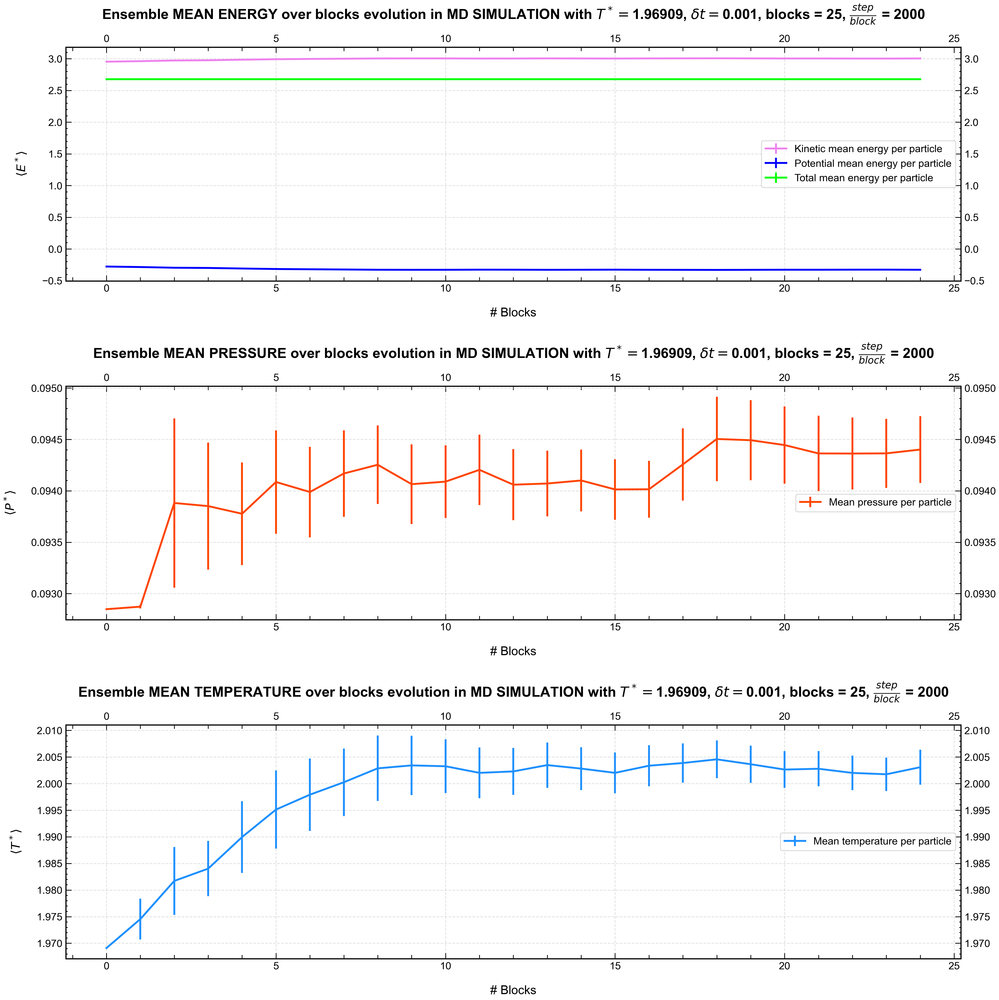

In [28]:
simulation_start_T = 1.96909

# Creating a list of filenames
path_to_file = "es_4.3/back_2/OUTPUT/"
file = ["kinetic_energy.dat", "potential_energy.dat", "total_energy.dat", "pressure.dat", "temperature.dat"]

# Creating the list of full file paths (ciclo for analogo ai cicli for di C++ con vector)
filename = [path_to_file + f for f in file]

X = np.arange(0, N_blocks_reverse_2)

# Titles and legends for the plots
titolo = ["MEAN ENERGY",
          "MEAN ENERGY",
          "MEAN ENERGY",
          "MEAN PRESSURE",
          "MEAN TEMPERATURE"]
legenda = ["Kinetic mean energy per particle", "Potential mean energy per particle", "Total mean energy per particle", "Mean pressure per particle", "Mean temperature per particle"]
yasse = [r"$\langle P^* \rangle$", r"$\langle T^* \rangle$"]
colore = ["violet", "blue", "lime", "orangered", "dodgerblue"]

# Creating the figure and axes
fig, axs = plt.subplots(3, 1, figsize=(15, 15))  # 3 rows, 1 column

for i in range(5):

    # Loading the data from the file
    val, error = np.loadtxt(filename[i], usecols = (2, 3), delimiter = None, unpack = True)

    # Plotting the data
    if i < 3:  # For energy plots
        axs[0].errorbar(X, val, yerr = error, color = colore[i], label = legenda[i])
        axs[0].set_title("Ensemble " + str(titolo[i]) + r" over blocks evolution in MD SIMULATION with $T^* = $" + 
                        str(simulation_start_T) + r", $\delta t = $" + str(delta_t) + r", blocks = " + str(N_blocks_reverse_2) + 
                        r", $\frac{step}{block}$ = " +  str(N_step_per_block), pad = 30)
        axs[0].set_xlabel("# Blocks", labelpad = 15)
        axs[0].set_ylabel(r"$\langle E^* \rangle$", labelpad = 15)
        # axs[0].grid(True)
        axs[0].legend()
    else:  # For pressure and temperature plots
        axs[i - 2].errorbar(X, val, yerr = error, color = colore[i], label = legenda[i])
        axs[i - 2].set_title("Ensemble " + str(titolo[i]) + r" over blocks evolution in MD SIMULATION with $T^* = $" + 
                            str(simulation_start_T) + r", $\delta t = $" + str(delta_t) + r", blocks = " + str(N_blocks_reverse_2) + 
                            r", $\frac{step}{block}$ = " +  str(N_step_per_block), pad = 30)
        axs[i - 2].set_xlabel("# Blocks", labelpad = 15)
        axs[i - 2].set_ylabel(yasse[i - 3], labelpad = 15)
        # axs[i - 2].grid(True)
        axs[i - 2].legend(loc = "center right")

# Optimize the layout
plt.tight_layout()
plt.subplots_adjust(
    wspace=0.3,  # Spazio orizzontale
    hspace=0.45,  # Spazio verticale: default
    # top=0.92     # move below plots (gives space to suptitle)
)

# Save plot
plt.savefig("es_4.3/back_2/plot/thermodynamic_state_mean_variables.png")

# Display the plot
plt.show()

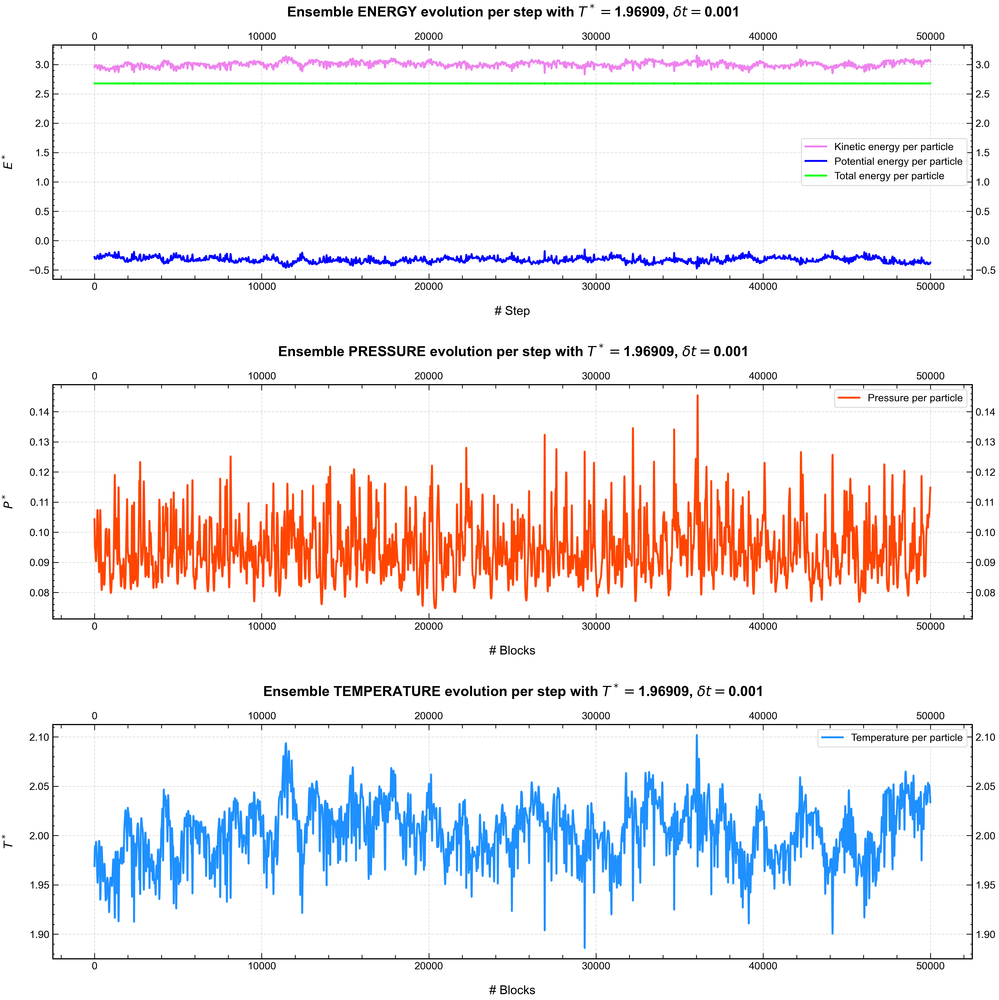

In [29]:
# Creating a list of filenames
file = ["kinetic_energy_step.dat", "potential_energy_step.dat", "total_energy_step.dat", "pressure_step.dat", "temperature_step.dat"]

# Creating the list of full file paths (ciclo for analogo ai cicli for di C++ con vector)
filename = [path_to_file + f for f in file]

X = np.arange(0, N_step_tot_reverse_2)

# Titles and legends for the plots
titolo = ["ENERGY",
          "ENERGY",
          "ENERGY",
          "PRESSURE",
          "TEMPERATURE"]
legenda = ["Kinetic energy per particle", "Potential energy per particle", "Total energy per particle", "Pressure per particle", "Temperature per particle"]
yasse = [r"$P^*$", r"$T^*$"]
colore = ["violet", "blue", "lime", "orangered", "dodgerblue"]

# Creating the figure and axes
fig, axs = plt.subplots(3, 1, figsize=(15, 15))  # 3 rows, 1 column

for i in range(5):

    # Loading the data from the file
    val = np.loadtxt(filename[i], delimiter = None)

    # Plotting the data
    if i < 3:  # For energy plots
        axs[0].plot(X, val, color = colore[i], label = legenda[i])
        axs[0].set_title("Ensemble " + str(titolo[i]) + r" evolution per step with $T^* = $" + 
                        str(simulation_start_T) + r", $\delta t = $" + str(delta_t), pad = 30)
        axs[0].set_xlabel("# Step", labelpad = 15)
        axs[0].set_ylabel(r"$E^*$", labelpad = 15)
        # axs[0].grid(True)
        axs[0].legend()
    else:  # For pressure and temperature plots
        axs[i - 2].plot(X, val, color = colore[i], label = legenda[i])
        axs[i - 2].set_title("Ensemble " + str(titolo[i]) + r" evolution per step with $T^* = $" + 
                            str(simulation_start_T) + r", $\delta t = $" + str(delta_t), pad = 30)
        axs[i - 2].set_xlabel("# Blocks", labelpad = 15)
        axs[i - 2].set_ylabel(yasse[i - 3], labelpad = 15)
        # axs[i - 2].grid(True)
        axs[i - 2].legend()

# Optimize the layout
plt.tight_layout()
plt.subplots_adjust(
    wspace=0.3,  # Spazio orizzontale
    hspace=0.45,  # Spazio verticale: default
    # top=0.92     # move below plots (gives space to suptitle)
)

# Save plot
plt.savefig("es_4.3/back_2/plot/thermodynamic_state_variables_per_step.png")

# Display the plot
plt.show()

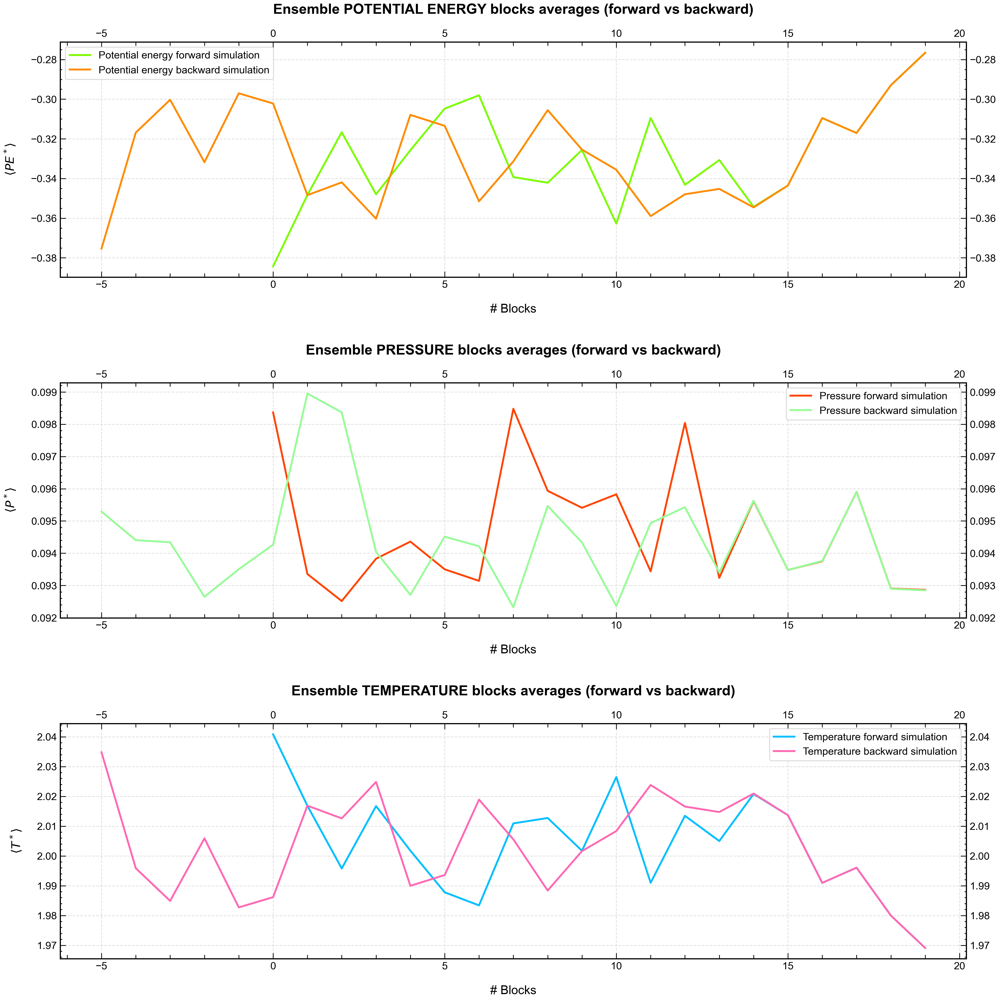

In [30]:
path_to_file_backward = "es_4.3/back_2/OUTPUT/"
path_to_file_forward = "es_4.2/simulation/OUTPUT/"
file = ["potential_energy.dat", "pressure.dat", "temperature.dat"]

# Creating the list of full file paths (ciclo for analogo ai cicli for di C++ con vector)
filename_backward = [path_to_file_backward + f for f in file]
filename_forward = [path_to_file_forward + f for f in file]

X_fw = np.arange(0, N_blocks)
X_bw = np.arange(X_fw[-1], -6, -1)

# Titles and legends for the plots
titolo = ["POTENTIAL ENERGY",
          "PRESSURE",
          "TEMPERATURE"]
legenda_backward = ["Potential energy backward simulation", "Pressure backward simulation", "Temperature backward simulation"]
legenda_forward = ["Potential energy forward simulation", "Pressure forward simulation", "Temperature forward simulation"]
yasse = [r"$\langle PE^* \rangle$", r"$\langle P^* \rangle$", r"$\langle T^* \rangle$"]
# Colori per la simulazione indietro nel tempo
colore_backward = ["darkorange", "palegreen", "hotpink"]
# Colori per la simulazione in avanti nel tempo
colore_forward = ["lawngreen", "orangered", "deepskyblue"]

# Creating the figure and axes
fig, axs = plt.subplots(3, 1, figsize=(15, 15))  # 3 rows, 1 column

for i in range(3):

    # Loading the data from the file
    val_backward = np.loadtxt(filename_backward[i], usecols=(1), delimiter=None, unpack=True, skiprows=1)
    val_forward = np.loadtxt(filename_forward[i], usecols=(1), delimiter=None, unpack=True, skiprows=1)

    # Plotting the data
    
    axs[i].set_title("Ensemble " + str(titolo[i]) + " blocks averages (forward vs backward)", pad = 30)
    axs[i].plot(X_fw, val_forward, color=colore_forward[i], label=legenda_forward[i])
    axs[i].plot(X_bw, val_backward, color=colore_backward[i], label=legenda_backward[i])
    axs[i].set_xlabel("# Blocks", labelpad = 15)
    axs[i].set_ylabel(yasse[i], labelpad = 15)
    axs[i].grid(True)
    axs[i].legend(loc="best")

# Optimize the layout
plt.tight_layout()
plt.subplots_adjust(
    wspace=0.3,  # Spazio orizzontale
    hspace=0.45,  # Spazio verticale: default
    # top=0.92     # move below plots (gives space to suptitle)
)

# Save plot
plt.savefig("es_4.3/back_2/plot/thermodynamic_state_variables_back_vs_for.png")
# Display the plot
plt.show()